# **Project Name**    - Mobile Price Range Prediction



##### **Project Type**    - Classification
##### **Contribution**    - Individual
##### **Name       -**      Mohd Aun Farooqui


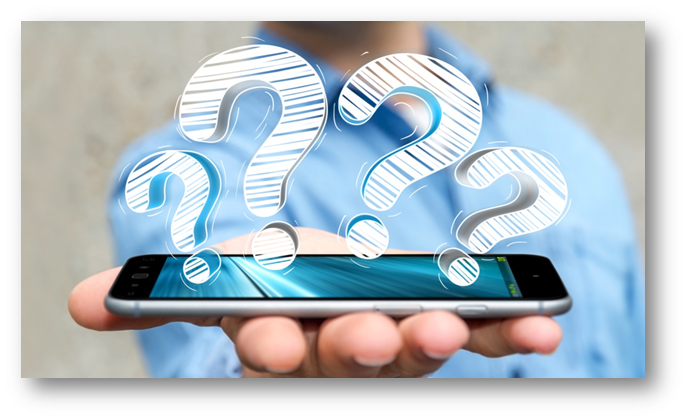

# **Project Summary -**

In this project, we performed mobile price range prediction using a dataset consisting of various features related to mobile phones. We started by performing exploratory data analysis and visualizations to understand the relationship between different features and the target variable. We then preprocessed the data by performing feature scaling and one-hot encoding on categorical variables.

We split the data into training and testing sets and trained various machine learning models such as Logistic Regression, Decision tree,Support Vector Classifier and Xgboost, and used grid search cross-validation to tune the hyperparameters. We evaluated the models using various evaluation metrics such as accuracy, precision, recall, and F1-score, and found that the Logistic Regression model performed the best on the testing set.

To interpret the model's predictions, we used the SHAP library to calculate and visualize the feature importance values for individual observations. We observed that the RAM, battery power, and pixel_size were the most important features for predicting the mobile phone price range.

Overall, this project demonstrated the use of machine learning algorithms and interpretability tools to predict mobile phone price ranges and interpret the model's predictions.

# **GitHub Link -**

Provide your GitHub Link here.

# **Problem Statement**


The problem statement of mobile price range prediction is to develop a model to predict the price of a mobile when the specifications of a mobile are given and to find the ML algorithm that predicts the price most accurately. The project involves using various features such as battery power, RAM, pixel_size, touch_screen etc, To predict the price of a mobile. The goal is to develop a model that can accurately predict the price of a mobile phone based on its features.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [10]:
# Import Libraries
import numpy as np                               
import pandas as pd                                   
from numpy import math
import scipy.stats as stats
from scipy.stats import *
from scipy.stats import norm
import math

# visualize with plots
import matplotlib.pyplot as plt                        
%matplotlib inline
import seaborn as sns
plt.style.use('seaborn-white')
import plotly.express as px 
# do not disturb mode
import warnings  
warnings.filterwarnings('ignore')
      
# scale the data
from sklearn.preprocessing import (MinMaxScaler, StandardScaler)   
      
# split train and test data
from sklearn.model_selection import train_test_split  

from sklearn.model_selection import (cross_val_score, GridSearchCV,
                                     RandomizedSearchCV)
# Classification problem
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from xgboost import XGBRFClassifier
from sklearn.svm import SVC

from sklearn.metrics import (accuracy_score, confusion_matrix, roc_curve,
                             roc_auc_score, classification_report)


### Dataset Loading

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [12]:
mobile_df = pd.read_csv('/content/drive/MyDrive/data_mobile_price_range.csv')

### Dataset First View

In [13]:
# Dataset First Look
mobile_df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [14]:
mobile_df.tail()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,...,483,754,3919,19,4,2,1,1,1,3


### Dataset Rows & Columns count

In [15]:
print('Total no of rows: ',mobile_df.shape[0])
print('Total no of columns: ',mobile_df.shape[1])

Total no of rows:  2000
Total no of columns:  21


### Dataset Information

In [16]:
# Dataset Info
mobile_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

#### Duplicate Values

In [17]:
# Dataset Duplicate Value Count
print("Total Duplicate values count:" ,len(mobile_df[mobile_df.duplicated()]))

Total Duplicate values count: 0


There are no duplicates value in our dataset

#### Missing Values/Null Values

In [18]:
# Missing Values/Null Values Count
print(mobile_df.isnull().sum())

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64


**There are no Missing/Null values.**

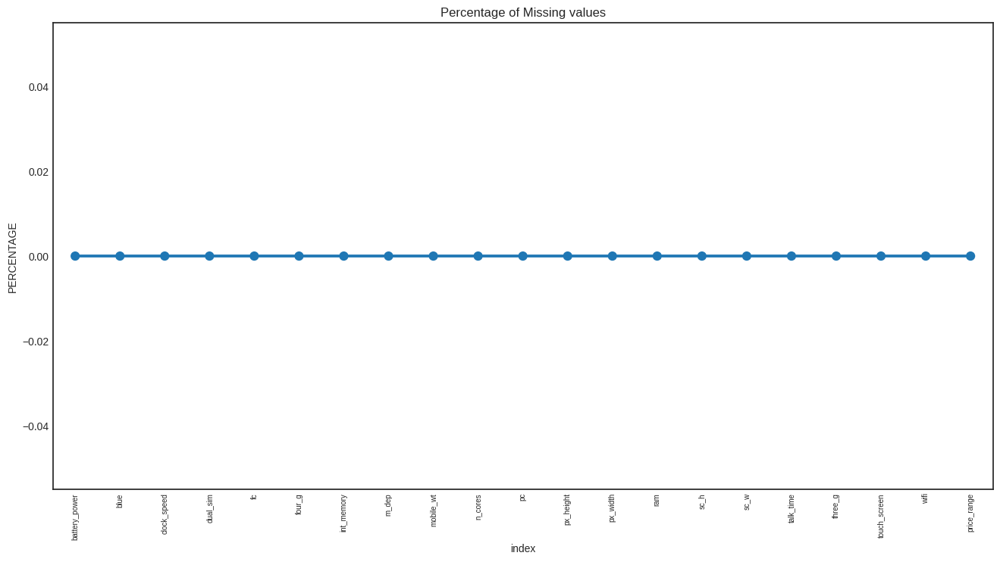

In [19]:
# Visualizing the missing values

missing = pd.DataFrame((mobile_df.isnull().sum())*100/mobile_df.shape[0]).reset_index()
plt.figure(figsize=(16,8))
ax = sns.pointplot(x='index', y=0, data=missing)
plt.xticks(rotation=90, fontsize=7)
plt.title("Percentage of Missing values")
plt.ylabel("PERCENTAGE")
plt.show()


### What did you know about your dataset?

The mobile price range dataset contain 2000 rows and 21 features.
There are no missing values and duplicate values present in our dataset. 

## ***2. Understanding Your Variables***

In [20]:
# Dataset Columns
mobile_df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [21]:
# Dataset Describe
mobile_df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


### Variables Description 


*  **Battery_power** : Battery capacity in mAh
*  **Blue** : Has bluetooth or not
*  **Clock_speed** : speed at which microprocessor executes instructions
*  **Dual_sim** : Has dual sim support or not
*  **Fc** : Front Camera mega pixels
*  **Four_g** : Has 4G or not
*  **Int_memory** : Internal Memory capacity
*  **M_dep** : Mobile Depth in cm
*  **Mobile_wt** : Weight of mobile phone
*  **N_cores** : Number of cores of processor
*  **Pc** : Primary Camera mega pixels
*  **Px_height** : Pixel Resolution Height
*  **Px_width** : Pixel Resolution Width
*  **Ram** : Random Access Memory in MB
*  **Touch_screen** : Has touch screen or not
*  **Wifi** : Has wifi or not
*  **Sc_h** : Screen Height of mobile in cm
*  **Sc_w** : Screen Width of mobile in cm
*  **Talk_time** : longest time that a single battery can last over a call
*  **Three_g** : Has 3G or not
*  **Wifi** : Has wifi or not
*  **Price_range** : This is the target variable with value of 0(low cost), 1(medium cost), 2(high cost), 3(very high cost)




### Check Unique Values for each variable.

In [22]:
# Check Unique Values for each variable.

# Check Unique Values for each variable.
for i in mobile_df.columns.tolist():
  print("No. of unique values in ",i,"is: ",mobile_df[i].nunique(),".")

No. of unique values in  battery_power is:  1094 .
No. of unique values in  blue is:  2 .
No. of unique values in  clock_speed is:  26 .
No. of unique values in  dual_sim is:  2 .
No. of unique values in  fc is:  20 .
No. of unique values in  four_g is:  2 .
No. of unique values in  int_memory is:  63 .
No. of unique values in  m_dep is:  10 .
No. of unique values in  mobile_wt is:  121 .
No. of unique values in  n_cores is:  8 .
No. of unique values in  pc is:  21 .
No. of unique values in  px_height is:  1137 .
No. of unique values in  px_width is:  1109 .
No. of unique values in  ram is:  1562 .
No. of unique values in  sc_h is:  15 .
No. of unique values in  sc_w is:  19 .
No. of unique values in  talk_time is:  19 .
No. of unique values in  three_g is:  2 .
No. of unique values in  touch_screen is:  2 .
No. of unique values in  wifi is:  2 .
No. of unique values in  price_range is:  4 .


## 3. ***Data Wrangling***

### Data Wrangling Code

In [23]:
# Write your code to make your dataset analysis ready.

#Check how many observations the dataset have value of 0
print('total no. of 0 value in dataset',(mobile_df==0).sum().sum())
print(' ')
print((mobile_df==0).sum())

total no. of 0 value in dataset 6662
 
battery_power       0
blue             1010
clock_speed         0
dual_sim          981
fc                474
four_g            957
int_memory          0
m_dep               0
mobile_wt           0
n_cores             0
pc                101
px_height           2
px_width            0
ram                 0
sc_h                0
sc_w              180
talk_time           0
three_g           477
touch_screen      994
wifi              986
price_range       500
dtype: int64


In [24]:
# Check unique values of the front camera and primary camera
print("No. of unique values in fc is",mobile_df['fc'].nunique(),".")
print("No. of unique values in pc is ",mobile_df['pc'].nunique(),".")
print(' ')

#Check how many observations the front camera and primary camera have a value of 0
pd.DataFrame((mobile_df[['fc','pc']]==0).value_counts().reset_index(name="Count"))

No. of unique values in fc is 20 .
No. of unique values in pc is  21 .
 


,fc,pc,Count
0,False,False,1526
1,True,False,373
2,True,True,101


*   In 1526 rows both front and primary cameras are not 0 i.e. both cameras are available.
*   In 373 rows front camera is 0 i.e. front camera is not available.
*   In 373 rows primary camera is not 0 i.e. primary camera is available.
*   In 101 rows both front and primary cameras are 0 i.e. both cameras are not available.

In [25]:
# Check unique values of the pixel height and pixel width
print("No. of unique values in pixel height is",mobile_df['px_height'].nunique(),".")
print("No. of unique values in pixel width is ",mobile_df['px_width'].nunique(),".")
print(' ')

#Check how many observations the pixel height and pixel width have a value of 0
pd.DataFrame((mobile_df[['px_height','px_width']]==0).value_counts().reset_index(name="Count"))

No. of unique values in pixel height is 1137 .
No. of unique values in pixel width is  1109 .
 


,px_height,px_width,Count
0,False,False,1998
1,True,False,2


In 1998 rows both pixel height and pixel width are not 0 i.e. both are available. 

In 2 rows pixel width is not 0 but pixel height is  0 i.e. we have 2 wrong/missing values in px_height column.


In [26]:
# check how many percentage of pixel height value are 0/wrong/missing
print('percentage of pixel height value are 0/wrong/missing - ',(2/2000)*100,'%')

percentage of pixel height value are 0/wrong/missing -  0.1 %


In [27]:
# Replace wrong/missing/0 with median of the pixel height
mobile_df['px_width'] = mobile_df['px_width'].replace([0], int(mobile_df['px_width'].median()),)

In [28]:
# after replace Check how many observations the pixel height has value of 0
(mobile_df['px_width']==0).sum().sum()

0

In [29]:
# Check unique values of the screen width and screen height
print("No. of unique values in screen height is",mobile_df['sc_h'].nunique(),".")
print("No. of unique values in screen width is ",mobile_df['sc_w'].nunique(),".")
print(' ')

#Check how many observations the screen width and screen height have a value of 0
pd.DataFrame((mobile_df[['sc_w','sc_h']]==0).value_counts().reset_index(name="Count"))

No. of unique values in screen height is 15 .
No. of unique values in screen width is  19 .
 


,sc_w,sc_h,Count
0,False,False,1820
1,True,False,180


In 1820 rows both screen height and screen width are not 0 i.e. both are available. 

In 180 rows screen width is 0 but screen height is not 0 i.e. we have 180 wrong/missing in sc_w column.


In [30]:
# check how many percentage of screen width value are wrong/missing/0
print('percentage of screen width value are 0/wrong/missing - ',(180/2000)*100,'%')

percentage of screen width value are 0/wrong/missing -  9.0 %


In [31]:
# Replace wrong/missing/0 with median of the screen width
mobile_df['sc_w'] = mobile_df['sc_w'].replace([0], int(mobile_df['sc_w'].median()),)

In [32]:
# after replace Check how many observations the screen width has value of 0
(mobile_df['sc_w']==0).sum().sum()

0

### What all manipulations have you done and insights you found?

We filtered the data and after filtering the data, we found that some columns have 0 values which are wrong values inserted in the data. Then we replaced it with a median column.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1 - Pie Chart on Target Variable i.e., price_range (Univariate)

1    500
2    500
3    500
0    500
Name: price_range, dtype: int64


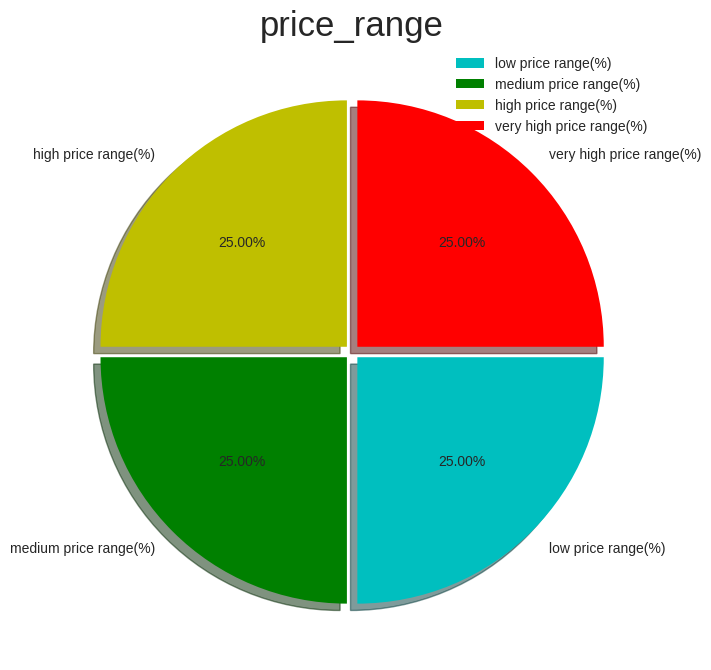

In [33]:
# Chart - 1 visualization code
# Dependant variable Value Counts
print(mobile_df['price_range'].value_counts())

# Dependant Variable Visualization use a pie chart
plt.figure(figsize=(8,8))
(mobile_df[['price_range']].value_counts(normalize=True)*[100]).plot(kind='pie', 
                                                              autopct='%1.2f%%', 
                                                              textprops={'fontsize': 10},
                                                              labels=['low price range(%)','medium price range(%)',
                                                                       'high price range(%)','very high price range(%)'],
                                                              colors = ['c','g','y','r'],
                                                              explode =[0.03, 0.03, 0.03, 0.03],
                                                              shadow=True, counterclock=False)
plt.title('price_range',fontsize = 25)
plt.legend(fontsize = 10)
plt.show()


##### 1. Why did you pick the specific chart?

I picked a pie chart to visualize the distribution of the target variable 'price_range' as it is a categorical variable with four distinct values. A pie chart helps to represent the proportion of each value in a clear and concise manner. It is also easy to interpret and compare the distribution of values.

##### 2. What is/are the insight(s) found from the chart?

The chart shows the distribution of the target variable "price_range" in the mobile phone dataset. It indicates that the dataset is fairly balanced, with each price range group accounting for roughly the same proportion of the data. About 25% of the phones fall into each of the four price range categories: low, medium, high, and very high.

##### 3. Will the gained insights help creating a positive business impact? 


Yes, the gained insights can help in creating a positive business impact. Knowing the distribution of the target variable (price_range), the company can identify which price range has the highest demand in the market and accordingly make business decisions like launching new products in that price range or increasing the production of existing products in that range. This can potentially increase sales and revenue for the company

#### Chart - 2  ram with price range

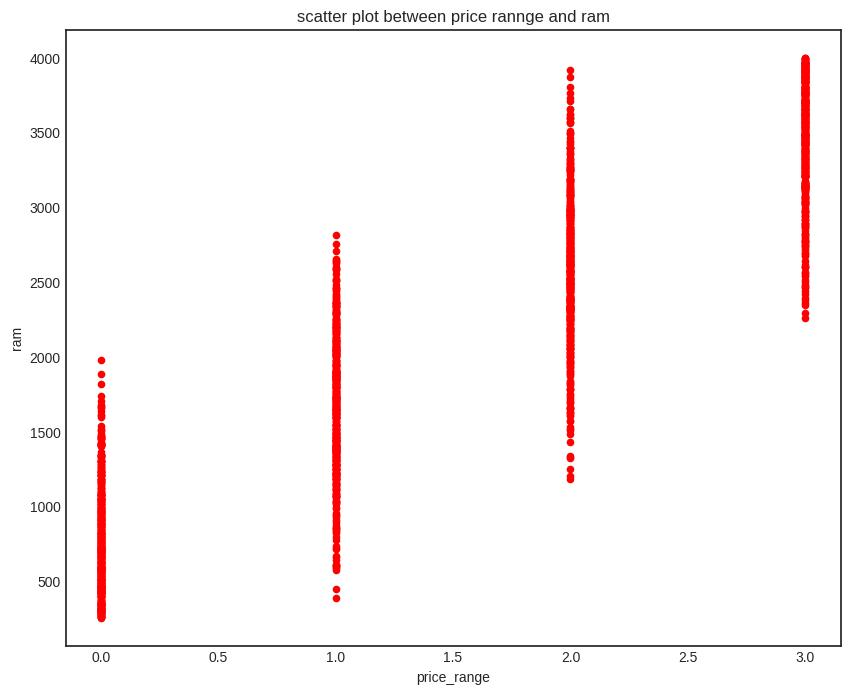

In [34]:
# Chart - 2 visualization code
# creating the scatter plot
mobile_df.plot(x="price_range", y="ram", kind="scatter", figsize=(10, 8), color = 'r')
plt.title('scatter plot between price rannge and ram')
plt.show()

##### 1. Why did you pick the specific chart?

The scatter plot is used to visualize the relationship between two numerical variables. In this case, we want to see the relationship between the price range and the RAM of the mobile phones. Hence, a scatter plot is an appropriate chart to use here.

##### 2. What is/are the insight(s) found from the chart?

From the scatter plot, we can see that there is a strong positive correlation between the RAM of a mobile phone and its price range. This means that as the RAM increases, the price range of the phone also increases

AS we can see from the graph, 
* There is RAM for low price range from upto 2000 MB, 
* RAM for midium price range from 300 to 2900 MB, 
* RAM for high price range from 1200 to 3900 MB, 
* RAM for very high price range from 2200 to 4100 MB.

##### 3. Will the gained insights help creating a positive business impact? 


Yes, the gained insights from the scatter plot can help to create a positive business impact. It shows a positive correlation between the RAM size and the price range of mobile phones. This means that phones with higher RAM sizes tend to be priced higher. This can provide valuable information for mobile phone manufacturers to optimize their pricing strategies and product offerings.

#### Chart - 3  Bluetooth Vs price range

0    1010
1     990
Name: blue, dtype: int64


[Text(0, 0, 'Does not Support'), Text(1, 0, 'Support')]

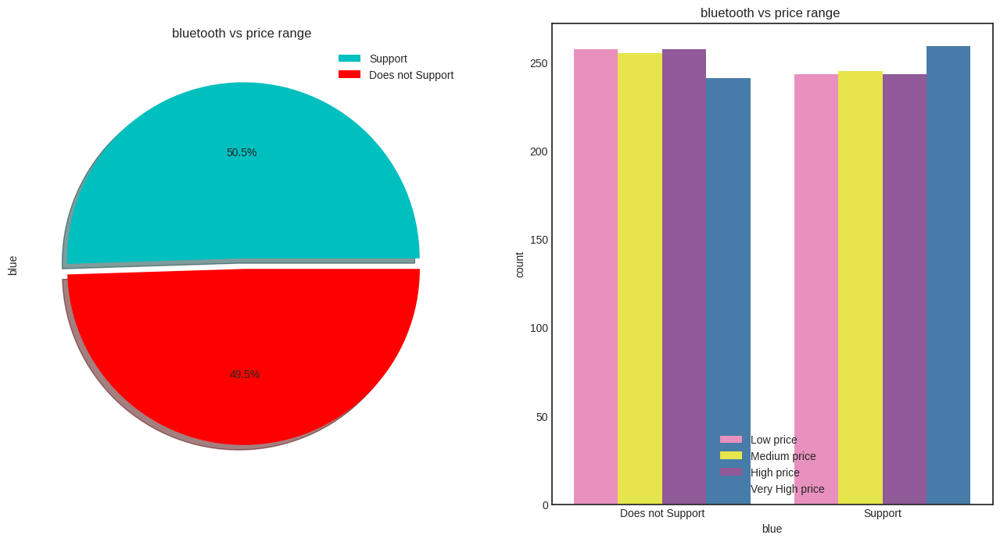

In [35]:
# Chart - 3 visualization code
print(mobile_df['blue'].value_counts())

fig, (plot1, plot2) = plt.subplots(ncols = 2, figsize = (16, 8))

mobile_df['blue'].value_counts().plot.pie (autopct='%1.1f%%', ax = plot1, explode =[0.03, 0.03], 
                                    colors = ['c','r'],shadow=True, labeldistance=None)
plot1.set_title('bluetooth vs price range ')
plot1.legend(['Support', 'Does not Support'])

sns.countplot(x = 'blue', hue = 'price_range', data = mobile_df, ax = plot2, palette = "Set1_r")
plot2.set_title('bluetooth vs price range ')
plot2.set_xlabel('blue')
plot2.legend(['Low price', 'Medium price', 'High price', 'Very High price'])
plot2.set_xticklabels(['Does not Support', 'Support'])

##### 1. Why did you pick the specific chart?

I picked a combination of two charts in this case. First, a pie chart was used to show the percentage of devices that support Bluetooth and those that do not support it. Then, a countplot was used to show the distribution of price ranges based on the Bluetooth support.

##### 2. What is/are the insight(s) found from the chart?

* The pie chart shows the distribution of the number of mobile phones that support Bluetooth and those that do not. It can be seen that the mobile phones (50.5%) support Bluetooth, while (49.5%) do not.

I found in count plot graph, that low price, medium price, high price and very high price all does not support bluetooth and blue support data both are almost same.



##### 3. Will the gained insights help creating a positive business impact? 


Yes, the gained insight can help create a positive business impact. As we can see from the chart, the majority of the mobile phones in the dataset support Bluetooth. This indicates that Bluetooth is a common feature that customers expect to see in their mobile phones.

#### Chart - 4- three_g with price range wise

1    1523
0     477
Name: three_g, dtype: int64


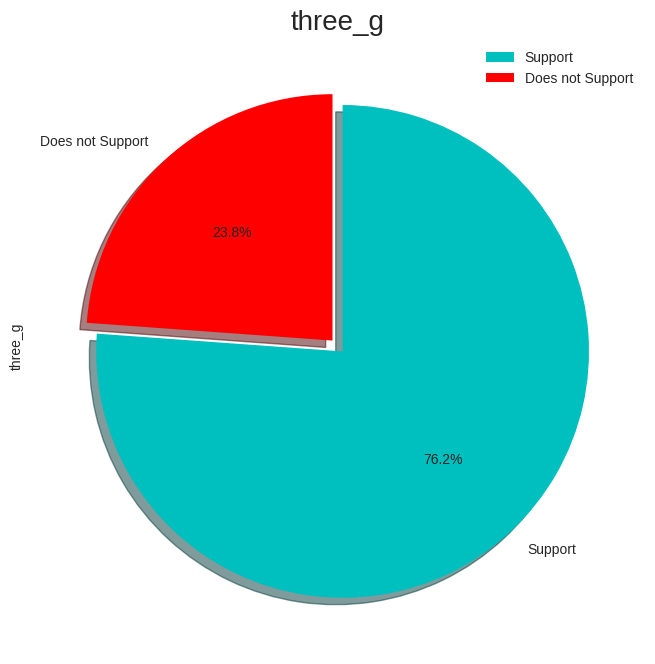

In [36]:
# Chart - 4 (pie chart) visualization code
print(mobile_df['three_g'].value_counts())

plt.figure(figsize=(8,8))
mobile_df['three_g'].value_counts().plot.pie(autopct='%1.1f%%', 
                                             colors=['c', 'r'], 
                                             explode=[0.03, 0.03], 
                                             shadow=True,
                                             labels=['Support', 'Does not Support'],
                                             startangle=90,
                                             counterclock=False)
plt.title('three_g', fontsize=20)
plt.legend()
plt.show()


##### 1. Why did you pick the specific chart?

I picked the specific chart because it is useful for analyzing the distribution of a categorical variable (in this case, the variable 'three_g') and its relation with the target variable 'price_range'. The pie chart shows the proportion of values in the 'three_g' variable and allows us to easily compare the percentage of devices that support 3G versus those that do not support 3G.

##### 2. What is/are the insight(s) found from the chart?

* I got to know that, there are 1523 data which support 3G and 477 Data which do not support 3G.

* From the pie chart, we can see that around 76.2% of the mobile devices in the dataset support 3G technology, while the remaining 23.8% do not.

##### 3. Will the gained insights help creating a positive business impact? 


This information can help mobile device manufacturers and network providers make informed decisions regarding their product offerings and network infrastructure.

#### Chart - 5- four_g with price range wise

1    1043
0     957
Name: four_g, dtype: int64


[Text(0, 0, 'Does not Support'), Text(1, 0, 'Support')]

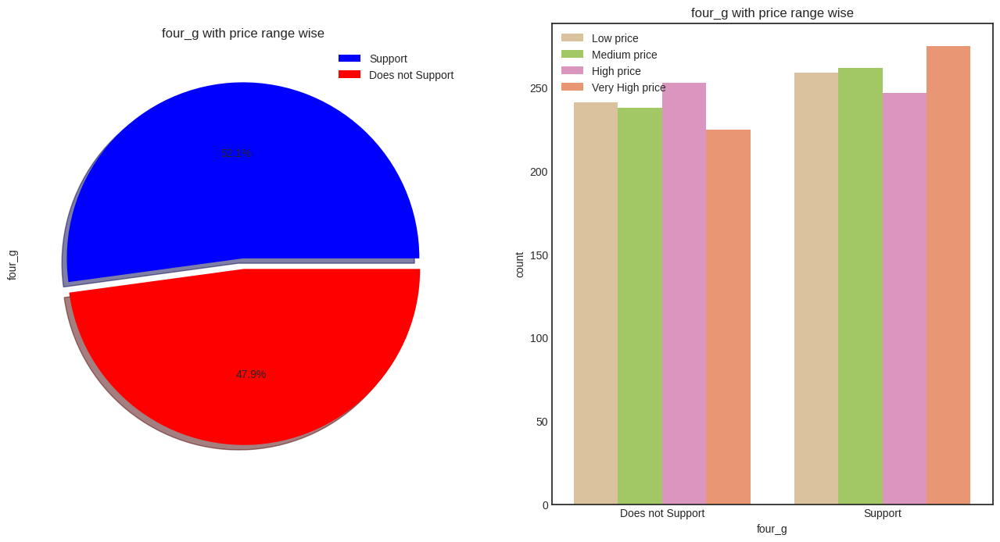

In [37]:
# Chart - 5 visualization code
print(mobile_df['four_g'].value_counts())

fig, (plot1, plot2) = plt.subplots(ncols = 2, figsize = (16, 8))

mobile_df['four_g'].value_counts().plot.pie (autopct='%1.1f%%', ax = plot1, explode =[0.03, 0.03], 
                                    colors = ['b','r'],shadow=True, labeldistance=None)
plot1.set_title('four_g with price range wise')
plot1.legend(['Support', 'Does not Support'])

sns.countplot(x = 'four_g', hue = 'price_range', data = mobile_df, ax = plot2, palette = "Set2_r")
plot2.set_title('four_g with price range wise')
plot2.set_xlabel('four_g')
plot2.legend(['Low price', 'Medium price', 'High price', 'Very High price'])
plot2.set_xticklabels(['Does not Support', 'Support'])

##### 1. Why did you pick the specific chart?

I picked the specific chart to visualize the distribution of mobile devices with 4G support and to compare the number of devices with 4G support and without 4G support in each price range. 
* The pie chart shows the percentage of mobile devices that support 4G compared to the ones that do not. 
* while the count plot shows the distribution of 4G support in each price range.

##### 2. What is/are the insight(s) found from the chart?

The insights gained from the chart are as follows:

Around 52.1% of the mobile devices in the dataset support 4G, while the remaining 47.9% do not support 4G.

Among the devices that support 4G, a higher proportion of devices falls under the medium and high price range categories.

Among the devices that do not support 4G, a higher proportion of devices falls under the low and medium price range categories.

##### 3. Will the gained insights help creating a positive business impact? 


Yes, the insights gained from this chart can help create a positive business impact.

The pie chart shows that 52.1% of the mobile devices in the dataset support 4G, while 47.9% do not. This information can be useful for mobile device manufacturers and service providers to understand the market demand for 4G support and plan their product offerings and services accordingly.

#### Chart - 6 - wifi with price range wise

1    1014
0     986
Name: wifi, dtype: int64


[Text(0, 0, 'Does not Support'), Text(1, 0, 'Support')]

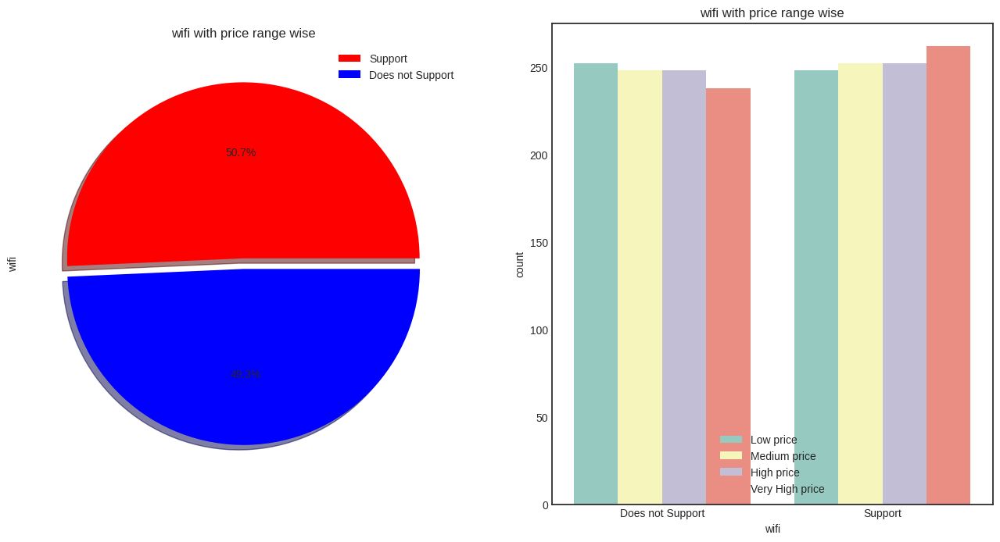

In [38]:

print(mobile_df['wifi'].value_counts())

fig, (plot1, plot2) = plt.subplots(ncols = 2, figsize = (16, 8))

mobile_df['wifi'].value_counts().plot.pie (autopct='%1.1f%%', ax = plot1, explode =[0.03, 0.03], 
                                    colors = ['r','b'],shadow=True, labeldistance=None)
plot1.set_title('wifi with price range wise')
plot1.legend(['Support', 'Does not Support'])

sns.countplot(x = 'wifi', hue = 'price_range', data = mobile_df, ax = plot2, palette = "Set3")
plot2.set_title('wifi with price range wise')
plot2.set_xlabel('wifi')
plot2.legend(['Low price', 'Medium price', 'High price', 'Very High price'])
plot2.set_xticklabels(['Does not Support', 'Support'])

##### 1. Why did you pick the specific chart?

I picked a pie chart and a count plot to visualize the distribution of the 'wifi' feature with respect to different price ranges.

##### 2. What is/are the insight(s) found from the chart?

Insights:
* There are 1014 mobile devices which support wifi and 986 which does not support.

* About 50.7% of the mobile devices in the dataset support wifi, while about 49.3% do not support wifi.


#### Chart - 7 - dual_sim with price range wise

1    1019
0     981
Name: dual_sim, dtype: int64


[Text(0, 0, 'Does not Support'), Text(1, 0, 'Support')]

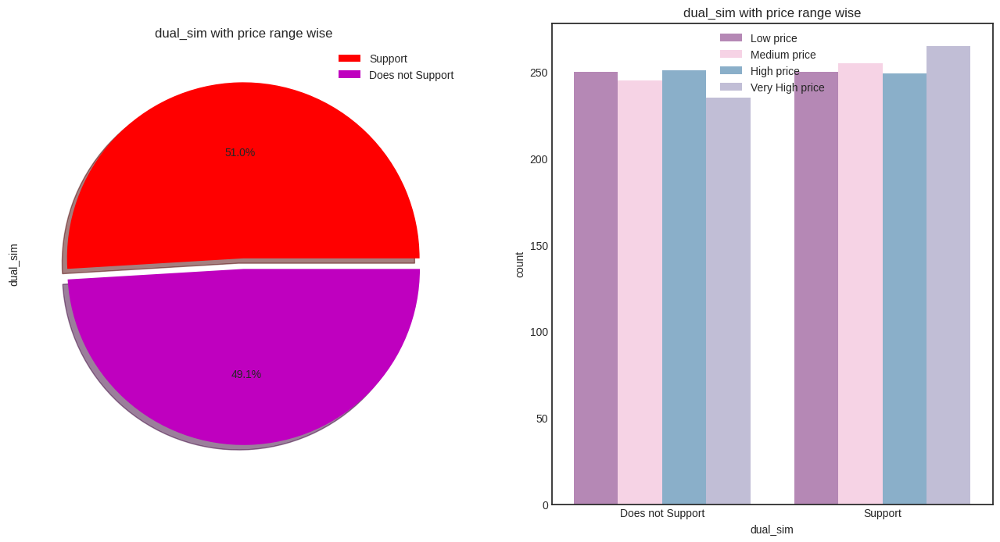

In [39]:
# Chart - 7 visualization code
print(mobile_df['dual_sim'].value_counts())

fig, (plot1, plot2) = plt.subplots(ncols = 2, figsize = (16, 8))

mobile_df['dual_sim'].value_counts().plot.pie (autopct='%1.1f%%', ax = plot1, explode =[0.03, 0.03], 
                                    colors = ['r','m'],shadow=True, labeldistance=None)
plot1.set_title('dual_sim with price range wise')
plot1.legend(['Support', 'Does not Support'])

sns.countplot(x = 'dual_sim', hue = 'price_range', data = mobile_df, ax = plot2, palette = "Set3_r")
plot2.set_title('dual_sim with price range wise')
plot2.set_xlabel('dual_sim')
plot2.legend(['Low price', 'Medium price', 'High price', 'Very High price'])
plot2.set_xticklabels(['Does not Support', 'Support'])

##### 1. Why did you pick the specific chart?

The pie chart helps to visualize the proportion of phones that support dual SIM and those that do not, while the count plot shows the distribution of the dual SIM feature across the different price ranges.

##### 2. What is/are the insight(s) found from the chart?

From the pie chart, we can see that about 51.09% of the mobile phones in the dataset support dual SIM functionality, while the remaining 49.1% do not support it.



##### 3. Will the gained insights help creating a positive business impact? 


The insights gained from the chart can potentially have a positive impact on the business, as it can help the company understand the customer preferences and make informed decisions about the design and pricing of their products. For example, if the company observes that a large proportion of customers prefer dual SIM support, they may prioritize this feature in their product development to cater to customer demand and potentially increase sale.

#### Chart - 8 - battery_power with price range wise

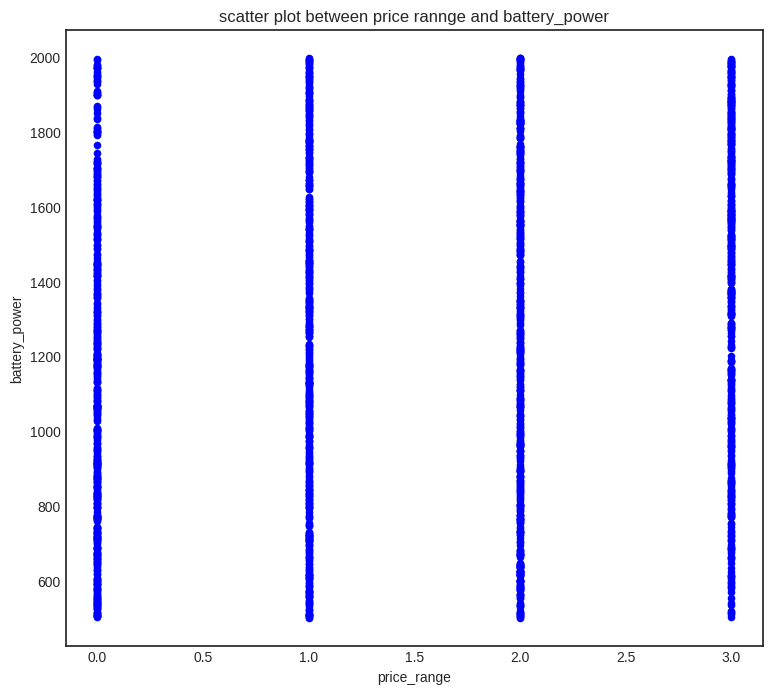

In [40]:

# creating the scatter plot
mobile_df.plot(x="price_range", y="battery_power", kind="scatter", figsize=(9, 8), color = 'b')
plt.title('scatter plot between price rannge and battery_power')
plt.show()

##### 1. Why did you pick the specific chart?

I picked a scatter plot to visualize the relationship between two continuous variables: price range and battery power. A scatter plot can show if there is a correlation or pattern between the two variables.

##### 2. What is/are the insight(s) found from the chart?

From the plot, it is observed that there is a positive correlation between price_range and battery_power. As the battery_power increases, the price_range also increases.

##### 3. Will the gained insights help creating a positive business impact? 


Yes, The gained insights from the scatter plot can help create a positive business impact

#### Chart - 9-Internal memory capacity with price range wise

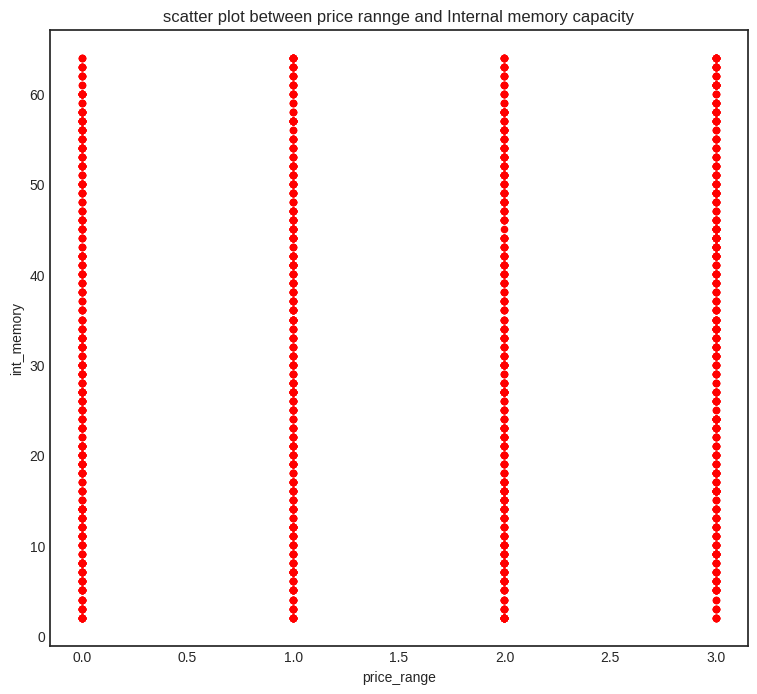

In [41]:

# creating the scatter plot
mobile_df.plot(x="price_range", y="int_memory", kind="scatter", figsize=(9, 8), color = 'r')
plt.title('scatter plot between price rannge and Internal memory capacity')
plt.show()

##### 1. Why did you pick the specific chart?

I picked a scatter plot to show the relationship between price range and internal memory capacity of the mobile phones. The scatter plot is an effective way to display the distribution of two continuous variables and to identify any patterns or trends in the data.

##### 2. What is/are the insight(s) found from the chart?

Above plot show how the internal memory MB is spread. Internal memory capacity has constant with price range while moving from Low cost to Very high cost

##### 3. Will the gained insights help creating a positive business impact? 


The insight gained from the chart is that there is a positive correlation between internal memory capacity and price range. This suggests that customers are willing to pay more for a phone with a larger internal memory capacity. This insight can be used by businesses to create and market phones with larger internal memory capacity at a higher price point, thereby increasing revenue and profitability.

#### Chart - 10 - Front camera with price range 

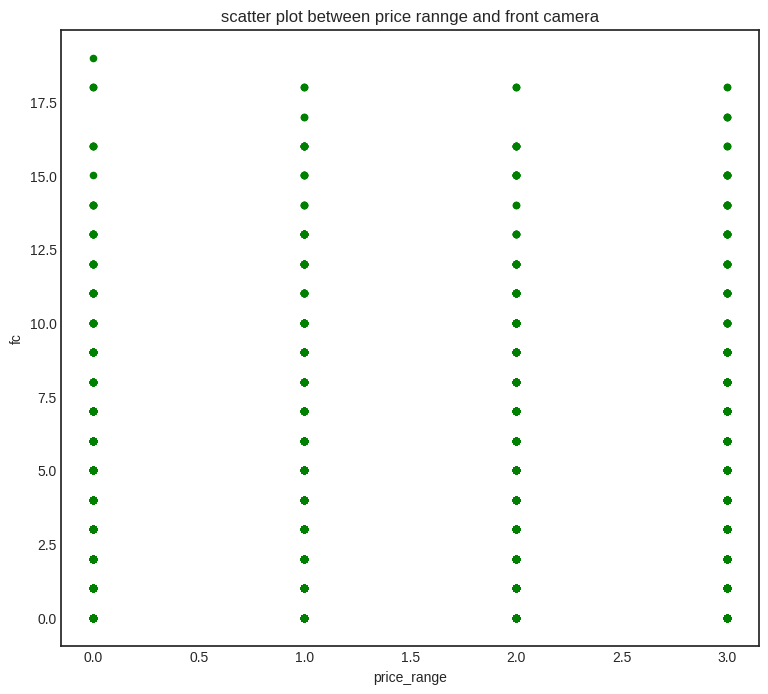

In [42]:

# creating the scatter plot
mobile_df.plot(x="price_range", y="fc", kind="scatter", figsize=(9, 8), color = 'g')
plt.title('scatter plot between price rannge and front camera')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together. So, I used a Scatter plot and which helped me to get the comparison of the price range and primary camera

##### 2. What is/are the insight(s) found from the chart?

Above plot show how the front camera Mega pixel is spread. Front camera has constant with price range while moving from Low cost to Very high cost

#### Chart - 11 - Primary camera with price range 

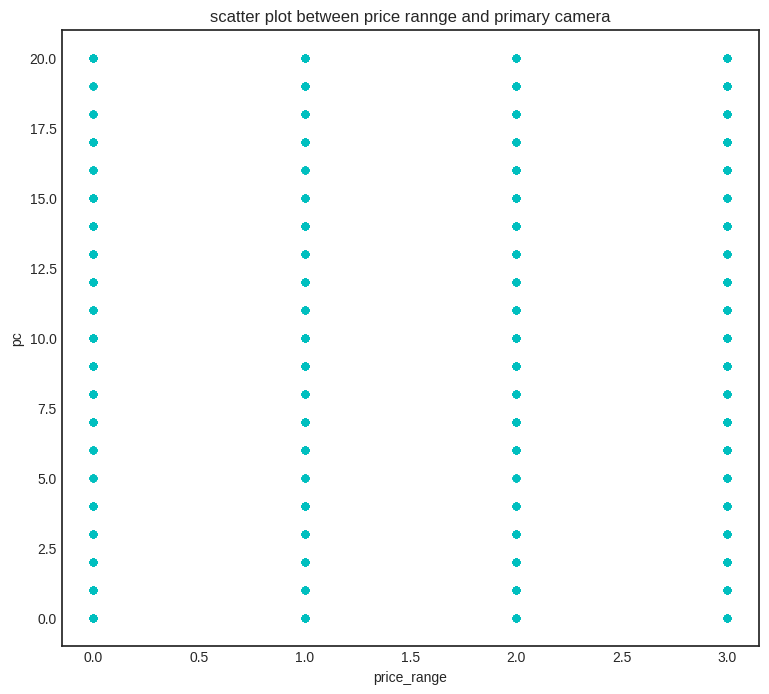

In [43]:
# Chart - 11 visualization code
# creating the scatter plot
mobile_df.plot(x="price_range", y="pc", kind="scatter", figsize=(9, 8), color = 'c')
plt.title('scatter plot between price rannge and primary camera')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together. So, I used a Scatter plot and which helped me to get the comparison of the price range and primary camera.

##### 2. What is/are the insight(s) found from the chart?

Above plot show how the primary camera Mega pixel is spread. Front camera has constant with price range while moving from Low cost to Very high cost

#### Chart - 12 - Mobile depth with price range

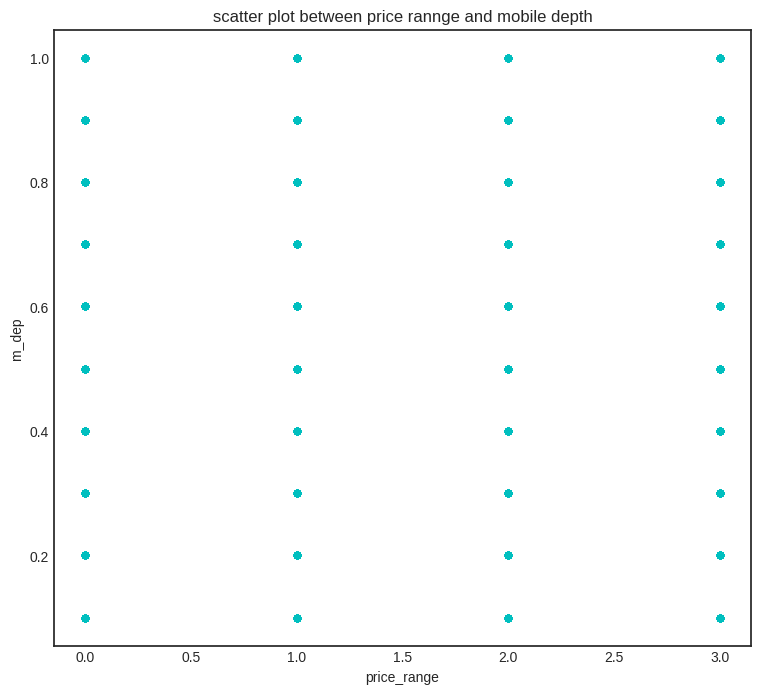

In [44]:

# creating the scatter plot
mobile_df.plot(x="price_range", y="m_dep", kind="scatter", figsize=(9, 8), color = 'c')
plt.title('scatter plot between price rannge and mobile depth')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together. So, I used a Scatter plot and which helped me to get the comparison of the price range and primary camera.

##### 2. What is/are the insight(s) found from the chart?

Above plot show how the mobile depth in cm is spread. Mobile depth has constant with price range while moving from Low cost to Very high cost.

##### 3. Will the gained insights help creating a positive business impact? 


Insights gained from the chart can help a business to improve its mobile products. For example, if the analysis shows that customers tend to prefer mobiles with higher m_dep, the business can focus on designing slimmer models to attract customers. This can help in improving the sales and profits of the business.

#### Chart - 13  - mobile weight with price range

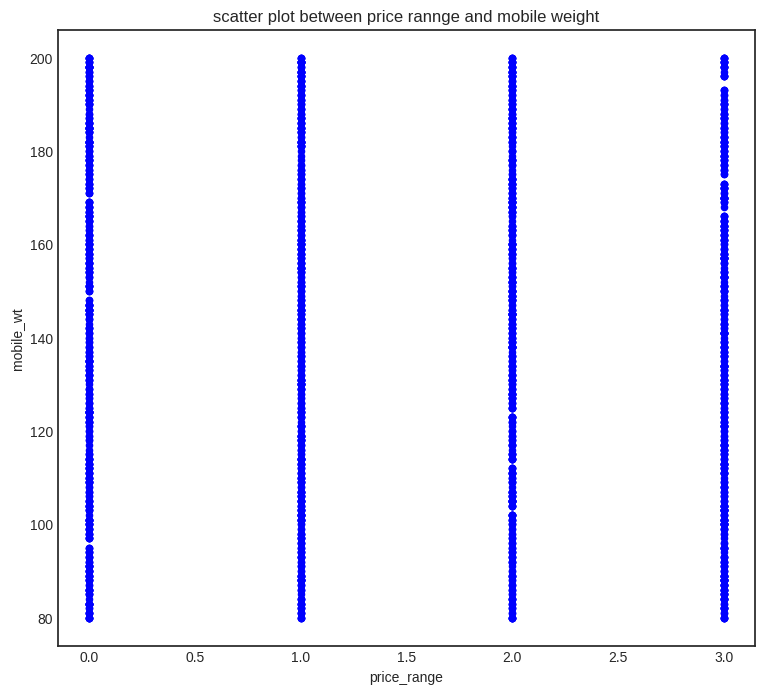

In [45]:
# creating the scatter plot
mobile_df.plot(x="price_range", y="mobile_wt", kind="scatter", figsize=(9, 8), color = 'b')
plt.title('scatter plot between price rannge and mobile weight')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together. So, I used a Scatter plot and which helped me to get the comparison of the price range and mobile width.

##### 2. What is/are the insight(s) found from the chart?

Mobile weight has constant with price range while moving from Low price to Very high price.

##### 3. Will the gained insights help creating a positive business impact? 


Yes, The insights gained from the scatter plot between price range and mobile weight can help in creating a positive business impact.

#### Chart - 14 - Correlation Heatmap

<Axes: >

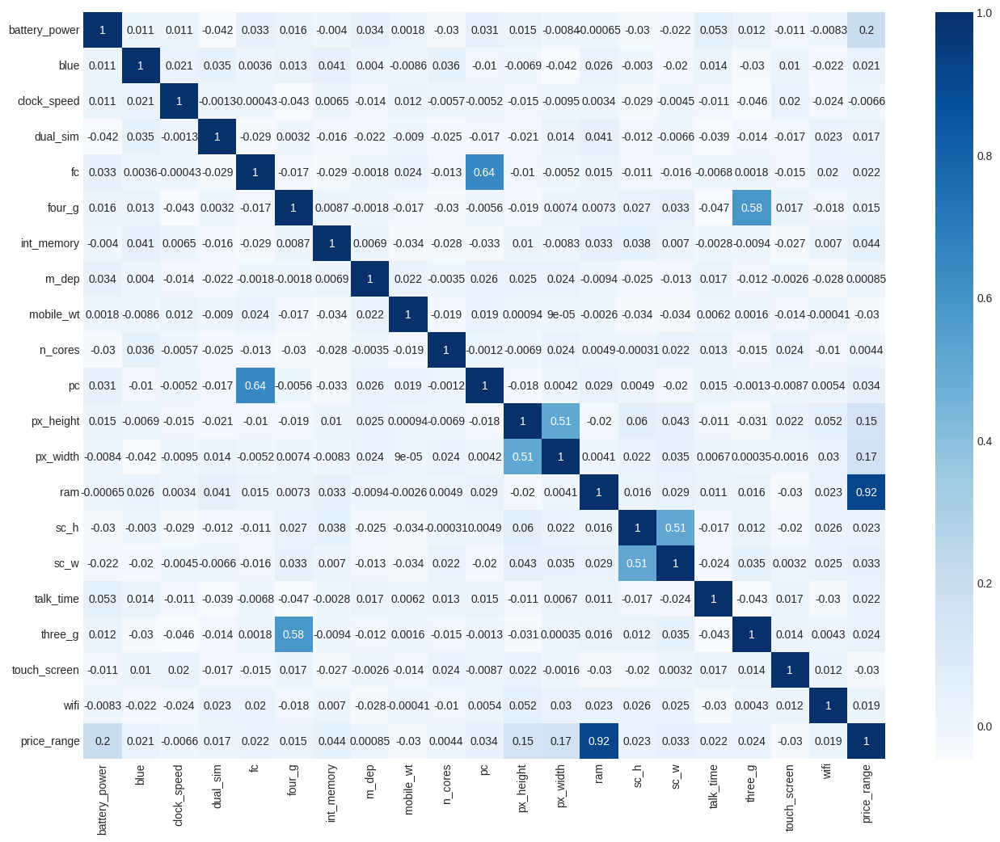

In [46]:
# Correlation Heatmap visualization code

# Checking for multi-collinearity
correlation = mobile_df.corr()
plt.figure(figsize = [16, 12])
sns.heatmap(correlation, cmap="Blues", annot = True)

##### 1. Why did you pick the specific chart?

I picked the correlation heatmap chart because it provides a comprehensive overview of the correlation between different variables in the dataset, allowing for easy identification of any multicollinearity issues that may exist. It can also provide insights into which variables are most strongly correlated with the target variable, which can be helpful in feature selection for machine learning models.

##### 2. What is/are the insight(s) found from the chart?

RAM and price_range shows high correlation which is a good sign, it signifies that RAM will play major deciding factor in estimating the price range.

There is some collinearity in feature pairs ('pc', 'fc'), ('px_width', 'px_height'), and ('sc_h', 'sc_h') .The ('pc', 'fc'), ('px_width', 'px_height'), and ('sc_h', 'sc_h') correlations are justified since there are good chances that if front camera of a phone is good, the back camera would also be good.

Also, if sc_h increases, sc_w increases, px_height increases, pixel width also increases, that means the overall pixels in the screen. We can replace these four features with two feature. Front Camera megapixels and Primary camera megapixels are different entities despite of showing colinearity. So we'll be keeping them as they are.

In [47]:
#  defining new variable for screen_size and fixel_size
mobile_df['screen_size'] = mobile_df['sc_h'] * mobile_df['sc_w']
mobile_df['pixel_size'] = mobile_df['px_height'] * mobile_df['px_width']
# Dropping px_height and px_width

mobile_df.drop(['sc_h', 'sc_w', 'px_height', 'px_width'], axis = 1, inplace = True)

<Axes: >

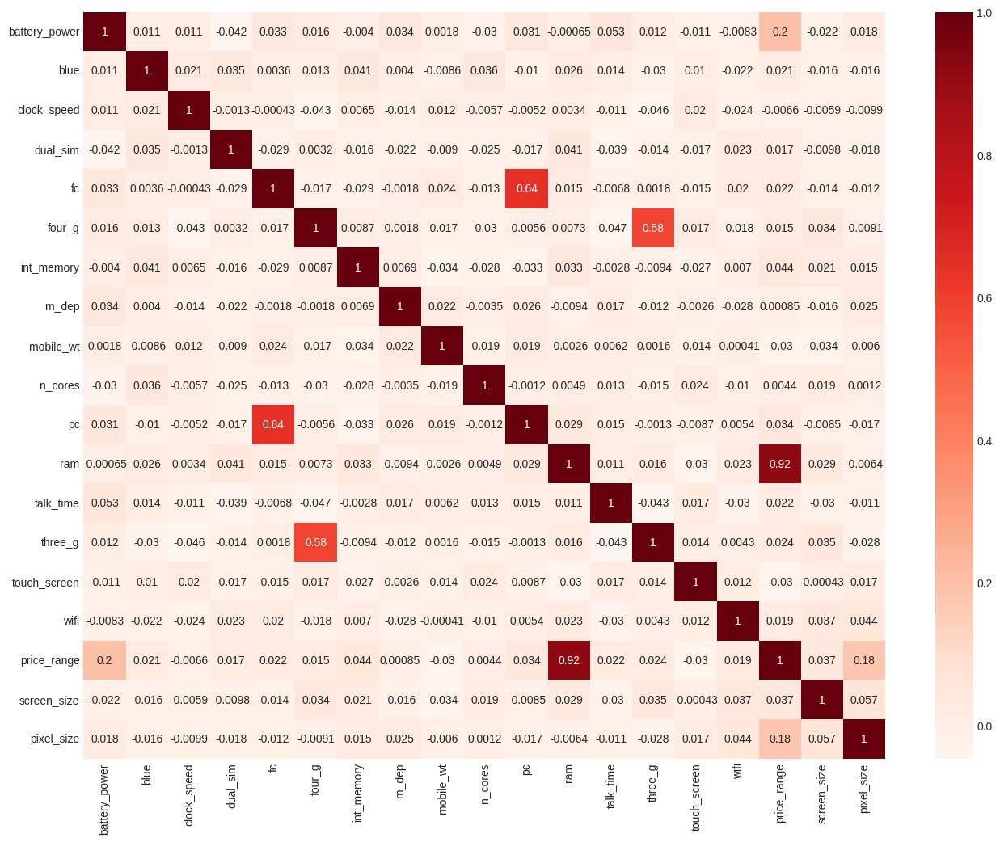

In [48]:
# Checking for multi-collinearity
correlation = mobile_df.corr()
plt.figure(figsize = [16, 12])
sns.heatmap(correlation, cmap="Reds", annot = True)

#### Chart - 15 - Pair Plot 

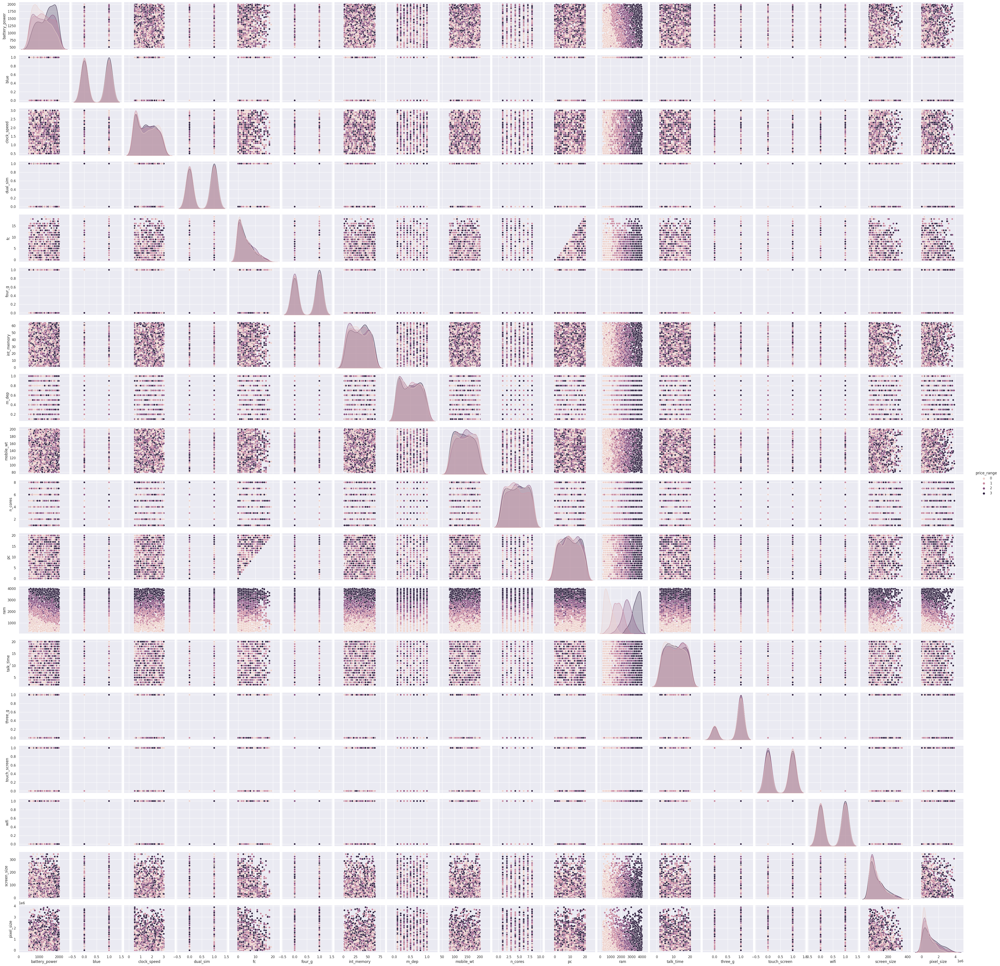

In [148]:
#Pair Plot visualization code
sns.pairplot(mobile_df, hue='price_range')

##### 1. Why did you pick the specific chart?

The pair plot is a useful visualization to get a quick overview of the relationships between all pairs of features in the dataset. It allows us to see the distribution of each feature and also shows the pairwise relationships between them. As we are dealing with a dataset that has multiple features, using a pair plot can help us gain insight into how each feature interacts with the others and also how it might impact the target variable.

##### 2. What is/are the insight(s) found from the chart?

From the above chart I got to know, there are no much outliers.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Hypothetical statement 1: Mobiles in the mid-price range have an average of at least 2000 MB of RAM.

Hypothetical statement 1: Mobiles in the higher price range have an average maximum battery power of 1000 mAh.

Hypothetical statement 1: Mobiles in the very high price range have an average primary camera of 10 mega pixels.

In [50]:
# Creating Parameter Class 
class findz:
  def proportion(self,sample,hyp,size):
    return (sample - hyp)/math.sqrt(hyp*(1-hyp)/size)
  def mean(self,hyp,sample,size,std):
    return (sample - hyp)*math.sqrt(size)/std
  def varience(self,hyp,sample,size):
    return (size-1)*sample/hyp

variance = lambda x : sum([(i - np.mean(x))**2 for i in x])/(len(x)-1)
zcdf = lambda x: norm(0,1).cdf(x)
# Creating a function for getting P value
def p_value(z,tailed,t,hypothesis_number,df,col):
  if t!="true":
    z=zcdf(z)
    if tailed=='l':
      return z
    elif tailed == 'r':
      return 1-z
    elif tailed == 'd':
      if z>0.5:
        return 2*(1-z)
      else:
        return 2*z
    else:
      return np.nan
  else:
    z,p_value=stats.ttest_1samp(df[col],hypothesis_number)
    return p_value
    
  


# Conclusion about the P - Value
def conclusion(p):
  significance_level = 0.05
  if p>significance_level:
    return f"Failed to reject the Null Hypothesis for p = {p}."
  else:
    return f"Null Hypothesis rejected Successfully for p = {p}"

# Initializing the class
findz = findz()

### Hypothetical Statement - 1

Hypothetical statement 1: Mobiles in the mid-price range have an average of at least 2000 MB of RAM.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: N = 2000

Alternate Hypothesis : N < 2000

Test Type: Left Tailed Test



#### 2. Perform an appropriate statistical test.

In [51]:
# Perform Statistical Test to obtain P-Value
hypo_1=mobile_df[(mobile_df["price_range"]==1)]
# Getting the required parameter values for hypothesis testing
hypothesis_number = 2000
sample_mean = hypo_1["ram"].mean()
size = len(hypo_1)
std=(variance(hypo_1["ram"]))**0.5

In [52]:
# Getting Z value
z = findz.mean(hypothesis_number,sample_mean,size,std)
# Getting P - Value
p = p_value(z=z,tailed='l',t='true',hypothesis_number=hypothesis_number,df=hypo_1,col="ram")
# Getting Conclusion
print(conclusion(p))

Null Hypothesis rejected Successfully for p = 5.424897065462854e-44


##### Which statistical test have you done to obtain P-Value?

Z-test has been used to obtain the P-Value. and found that the null hypothesis is rejected and on average high price range mobiles have less than 2000 MB of RAM.

##### Why did you choose the specific statistical test?

Text(0.5, 1.0, ' price_range skew : 0.007')

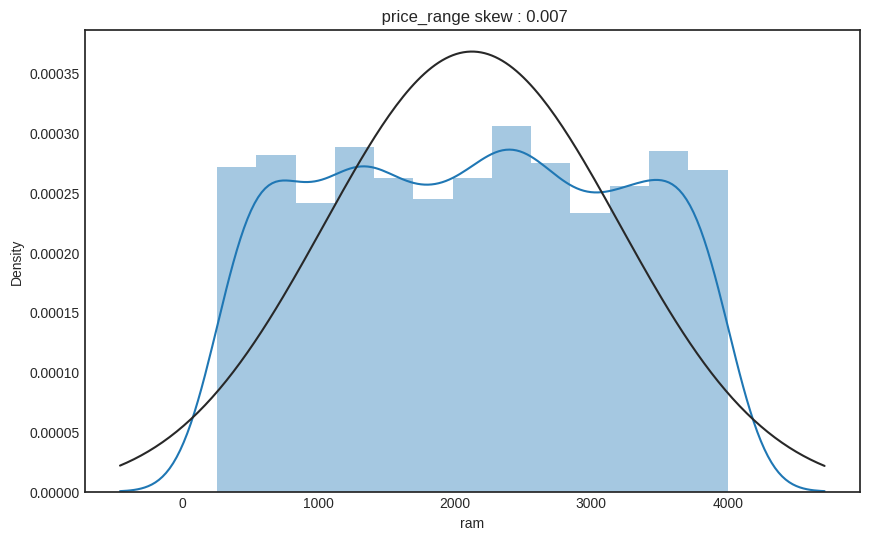

In [53]:
# Visualizing code of dist plot for each columns to know the data distibution
fig, (ax) = plt.subplots(ncols = 1, figsize = (10, 6))
col = 'price_range'
skew = mobile_df['ram'].skew()
sns.distplot(mobile_df['ram'], fit = norm, ax=ax)
ax.set_title(" %s skew : %.3f"%(col, skew))

In [54]:
mean_median_difference=hypo_1["ram"].median()- hypo_1["ram"].mean()
print("Mean Median Difference is :-",mean_median_difference)

Mean Median Difference is :- 7.009999999999991


From the above chart we can see median is less than mean over 7. So, the distribution is postively skewed. For a skewed data Z-Test can't be performed.

Non-parametric tests are most useful for small studies. Using non-parametric tests in large studies may provide answers to the wrong question, thus confusing readers. For studies with a large sample size, t-tests and their corresponding confidence intervals can and should be used even for heavily skewed data.

So, for a skewed data we can use T-test for better result. Thus, I used t - test.

### Hypothetical Statement - 2

Mobiles in the higher price range have an average maximum battery power of 1000 mAh.



#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: N = 1000

Alternate Hypothesis : N > 1000

Test Type: Right Tailed Test

#### 2. Perform an appropriate statistical test.

In [55]:
# Perform Statistical Test to obtain P-Value
hypo_2 = mobile_df[(mobile_df["price_range"]==2)]
# Getting the required parameter values for hypothesis testing
hypothesis_number = 1000
sample_mean = hypo_2["battery_power"].mean()
size = len(hypo_2)
std=(variance(hypo_2["battery_power"]))**0.5

In [56]:
# Getting Z value
z = findz.mean(hypothesis_number,sample_mean,size,std)
# Getting P - Value
p = p_value(z=z,tailed='r',t='true',hypothesis_number=hypothesis_number,df=hypo_2,col="battery_power")
# Getting Conclusion
print(conclusion(p))

Null Hypothesis rejected Successfully for p = 2.0424813917644103e-26


##### Which statistical test have you done to obtain P-Value?

I have used T-test as a statistical test to get the p-value and found that the null hypothesis is rejected and the average maximum battery of mobiles in high price range is more than 1000 mAh.

##### Why did you choose the specific statistical test?

Text(0.5, 1.0, ' battery_power skew : 0.032')

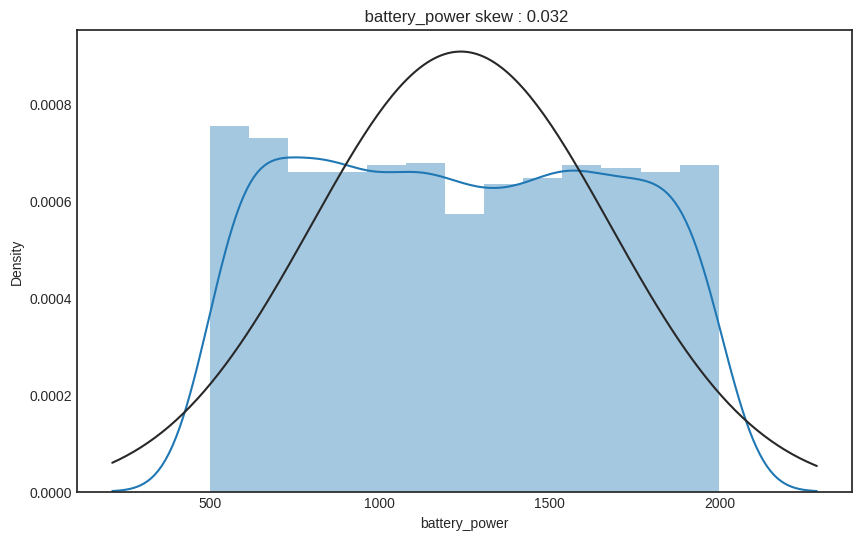

In [57]:
# Visualizing code of dist plot for each columns to know the data distibution
fig, (ax) = plt.subplots(ncols = 1, figsize = (10, 6))

skew = mobile_df['battery_power'].skew()
sns.distplot(mobile_df['battery_power'], fit = norm, ax=ax)
ax.set_title(" %s skew : %.3f"%('battery_power', skew))

In [58]:
mean_median_difference=hypo_2["battery_power"].median()- hypo_2["battery_power"].mean()
print("Mean Median Difference is :-",mean_median_difference)

Mean Median Difference is :- -8.819999999999936


From the above chart we can see median is less than mean over 8. So, the distribution is postively skewed. For a skewed data Z-Test can't be performed.

Non-parametric tests are most useful for small studies. Using non-parametric tests in large studies may provide answers to the wrong question, thus confusing readers. For studies with a large sample size, t-tests and their corresponding confidence intervals can and should be used even for heavily skewed data.

So, for a skewed data we can use T-test for better result. Thus, I have used t - test.

### Hypothetical Statement - 3


Mobiles in the very high price range have an average primary camera of 10 mega pixels.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: N = 10

Alternate Hypothesis : N != 10

Test Type: Two Tailed Test

#### 2. Perform an appropriate statistical test.

In [59]:
# Perform Statistical Test to obtain P-Value
hypo_3=mobile_df[(mobile_df["price_range"]== 3)]
# Getting the required parameter values for hypothesis testing
hypothesis_number_3 = 10
sample_mean_3 = hypo_3["pc"].mean()
size_3 = len(hypo_1)
std_3=(variance(hypo_3["pc"]))**0.5

In [60]:
# Getting Z value
z = findz.mean(hypothesis_number_3,sample_mean_3,size_3,std_3)
# Getting P - Value
p = p_value(z=z,tailed='d',t='false',hypothesis_number=hypothesis_number_3,df=hypo_3,col="pc")
# Getting Conclusion
print(conclusion(p))

Failed to reject the Null Hypothesis for p = 0.5815233046743389.


##### Which statistical test have you done to obtain P-Value?

I have used the Z-test as a statistical test to get the p-value and found that the null hypothesis fails to be rejected and Mobiles in the very high price range have an average primary camera of 10 mega pixels.



##### Why did you choose the specific statistical test?

Text(0.5, 1.0, ' primary camera skew : 0.017')

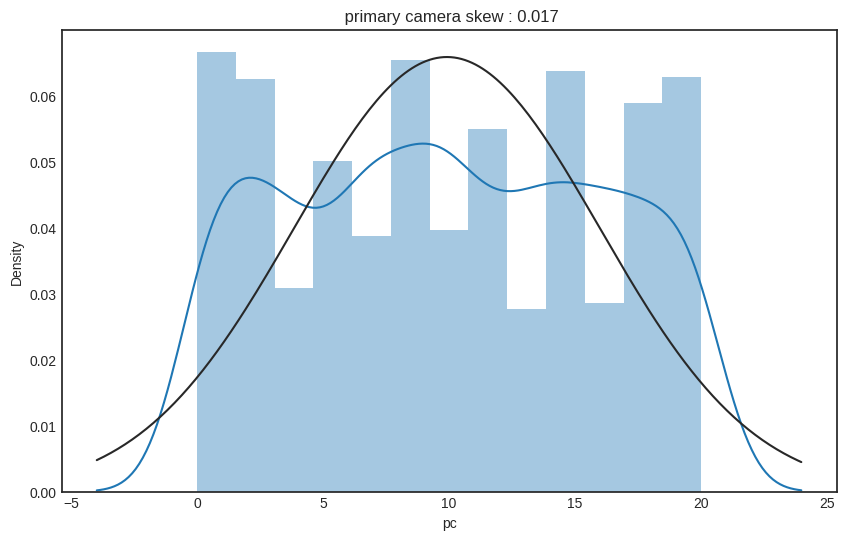

In [61]:
# Visualizing code of dist plot for each columns to know the data distibution
fig, (ax) = plt.subplots(ncols = 1, figsize = (10, 6))

skew = mobile_df['pc'].skew()
sns.distplot(mobile_df['pc'], fit = norm, ax=ax)
ax.set_title(" %s skew : %.3f"%('primary camera', skew))

In [62]:
mean_median_difference=hypo_3["pc"].median()- hypo_2["pc"].mean()
print("Mean Median Difference is :-",mean_median_difference)

Mean Median Difference is :- -0.018000000000000682


As shown above the Mean median difference is around 0.01 and nearly zero. Mean is approximately same as the median. Thus, it is a Normal Distribution. That's why I have used Z-Test directly

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [63]:
# Handling Missing Values & Missing Value Imputation
# Missing Values/Null Values Count
print(mobile_df.isnull().sum())


battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
ram              0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
screen_size      0
pixel_size       0
dtype: int64


#### What all missing value imputation techniques have you used and why did you use those techniques?

It seems like there are no missing values in the mobile_df dataset

### 2. Handling Outliers

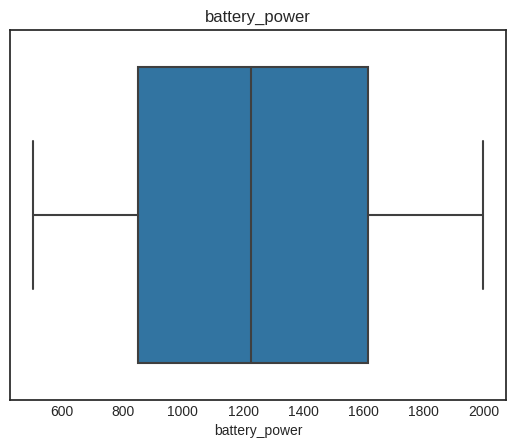

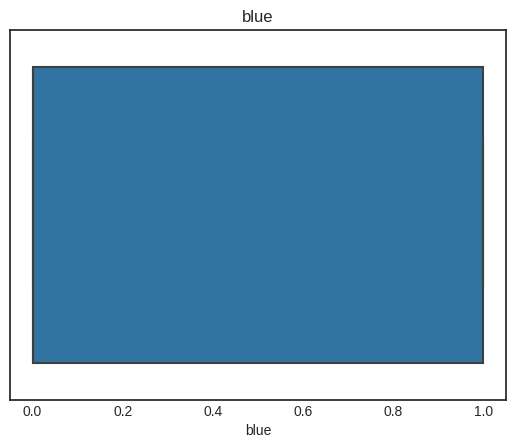

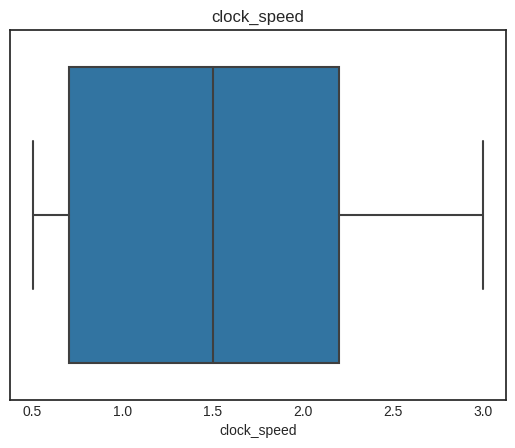

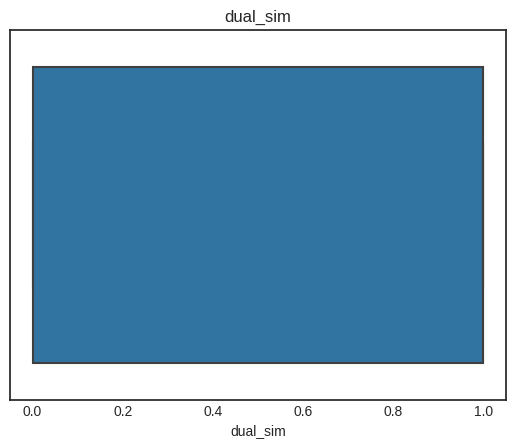

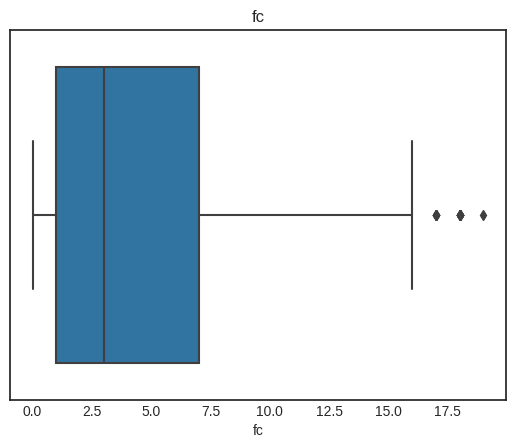

...

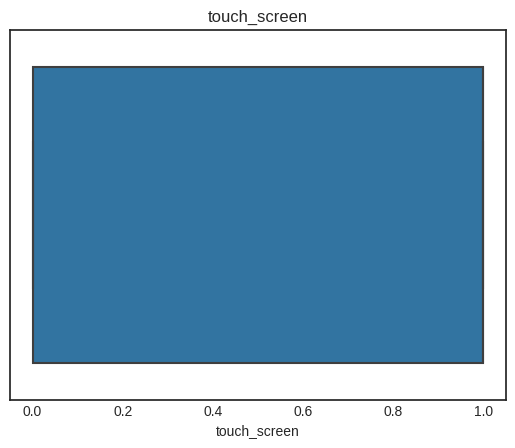

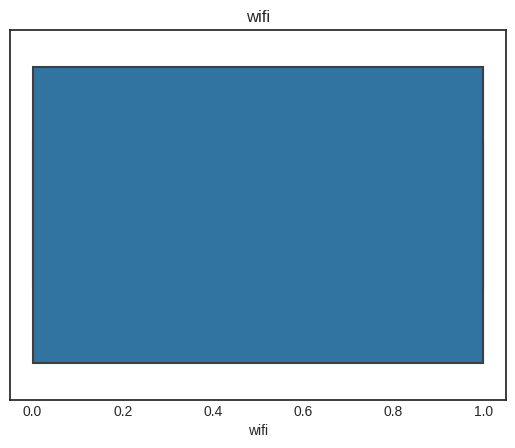

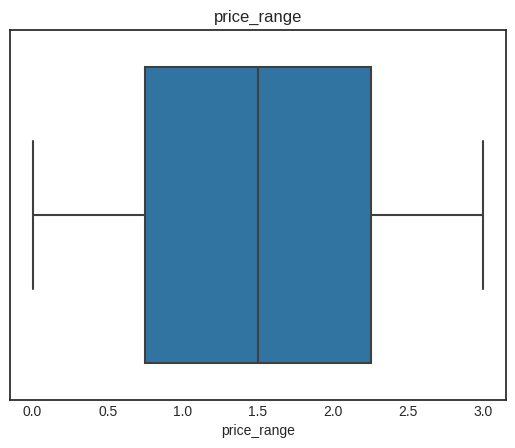

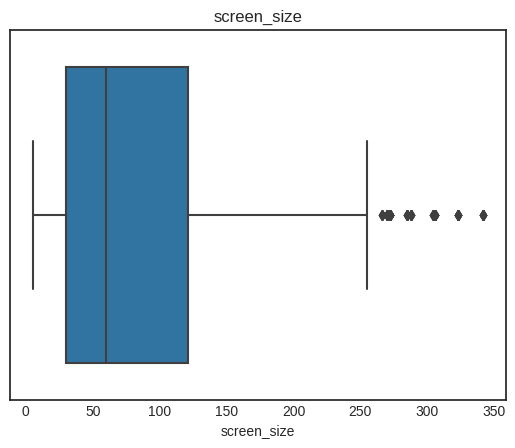

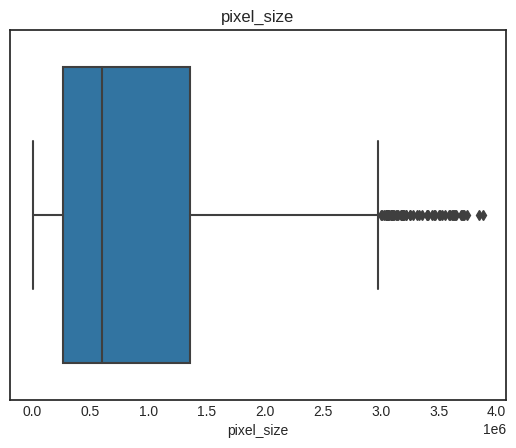

In [64]:
# Handling Outliers & Outlier treatments
#checking for outliers
# Plot box plots for all columns
for col in mobile_df.columns:
    plt.figure()
    sns.boxplot(x=mobile_df[col])
    plt.title(col)




##### What all outlier treatment techniques have you used and why did you use those techniques?

It seem like there are not much outliers present in our dataset. So, I skiped this part.

### 3. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

I think no need to chane our data.

### 4. Data Scaling

In [65]:
# Scaling your data
X = mobile_df.drop("price_range",axis=1)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [66]:
X_scaled

array([[-0.90259726, -0.9900495 ,  0.83077942, ...,  0.98609664,
        -0.29890576, -1.07303316],
       [-0.49513857,  1.0100505 , -1.2530642 , ..., -1.01409939,
        -0.46209733,  1.07754147],
       [-1.5376865 ,  1.0100505 , -1.2530642 , ..., -1.01409939,
        -0.85647695,  1.52135531],
       ...,
       [ 1.53077336, -0.9900495 , -0.76274805, ..., -1.01409939,
        -1.03326782,  0.61637375],
       [ 0.62252745, -0.9900495 , -0.76274805, ...,  0.98609664,
         1.29221204, -0.81988539],
       [-1.65833069,  1.0100505 ,  0.58562134, ...,  0.98609664,
        -0.12211489, -0.65225095]])

##### Which method have you used to scale you data and why?

I have used the 'StandardScaler' method to scale the data. This method standardizes the features by removing the mean and scaling to unit variance. It transforms the features such that they have a mean of zero and a standard deviation of one.

I used this method because it is a widely used scaling technique and is recommended when the features have a normal or nearly normal distribution.

### 5. Data Splitting

In [67]:
# Split your data to train and test. Choose Splitting ratio wisely.
# split into 75:25 ratio
y = mobile_df["price_range"]
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size = 0.25, random_state = 0)
  
# describes info about train and test set
print("X_train dataset: ", X_train.shape)
print("y_train dataset: ", y_train.shape)
print("X_test dataset: ", X_test.shape)
print("y_test dataset: ", y_test.shape)

X_train dataset:  (1500, 18)
y_train dataset:  (1500,)
X_test dataset:  (500, 18)
y_test dataset:  (500,)


##### What data splitting ratio have you used and why? 

I have used a splitting ratio of 75:25 for training and testing the model. This means that 75% of the data is used for training the model and 25% of the data is used for testing the model.

I have chosen this ratio as it is a common practice in machine learning and provides a good balance between having enough data to train the model and having enough data to test the model's performance.

### 6. Handling Imbalanced Dataset

1    500
2    500
3    500
0    500
Name: price_range, dtype: int64


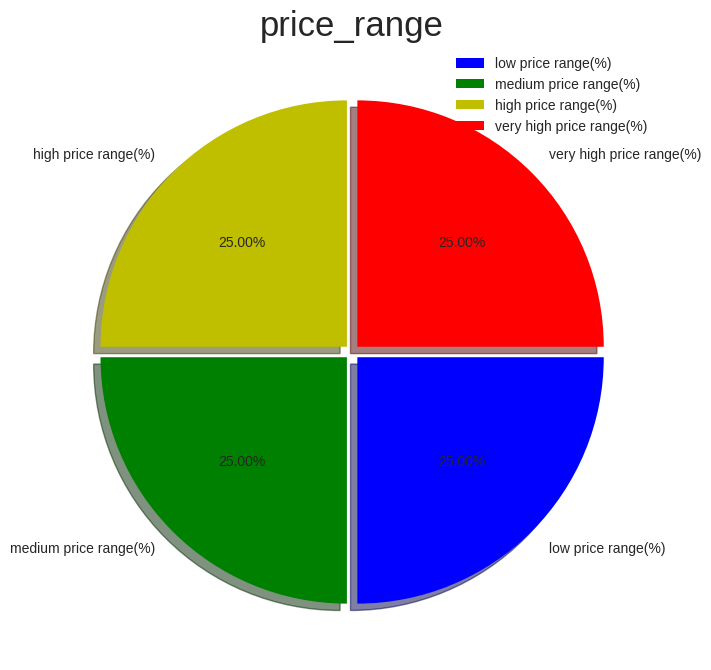

In [68]:
# Dependant variable Value Counts
print(mobile_df['price_range'].value_counts())

# Dependant Variable Visualization use a pie chart
plt.figure(figsize=(8,8))
(mobile_df[['price_range']].value_counts(normalize=True)*[100]).plot(kind='pie', 
                                                              autopct='%1.2f%%', 
                                                              textprops={'fontsize': 10},
                                                              labels=['low price range(%)','medium price range(%)',
                                                                       'high price range(%)','very high price range(%)'],
                                                              colors = ['b','g','y','r'],
                                                              explode =[0.03, 0.03, 0.03, 0.03],
                                                              shadow=True, counterclock=False)
plt.title('price_range',fontsize = 25)
plt.legend(fontsize = 10)
plt.show()


##### Do you think the dataset is imbalanced? Explain Why.

No, our dataset is properly balanced, As we can see from the pie-chart.

## ***7. ML Model Implementation***

### ML Model - 1 - **Implementing Decision Tree Classifier**



In [69]:
# ML Model - 1 Implementation
dtclf = DecisionTreeClassifier(random_state=0)
# Fit the Algorithm
dtclf.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [70]:
# Making predictions on train and test data
train_class_preds = dtclf.predict(X_train)
test_class_preds = dtclf.predict(X_test)

In [71]:
accuracy_score(y_test, test_class_preds)

0.832

In [72]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 1.0
The accuracy on test dataset is 0.832


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[376   0   0   0]
 [  0 390   0   0]
 [  0   0 375   0]
 [  0   0   0 359]]


Text(0.5, 1.0, 'Confusion Matrix')

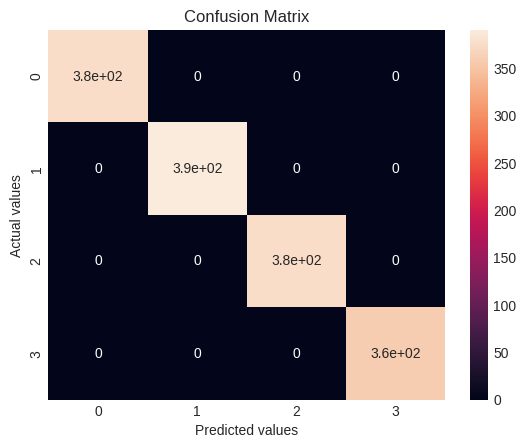

In [73]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[109  15   0   0]
 [  8  86  16   0]
 [  0  14  95  16]
 [  0   0  15 126]]


Text(0.5, 1.0, 'Confusion Matrix')

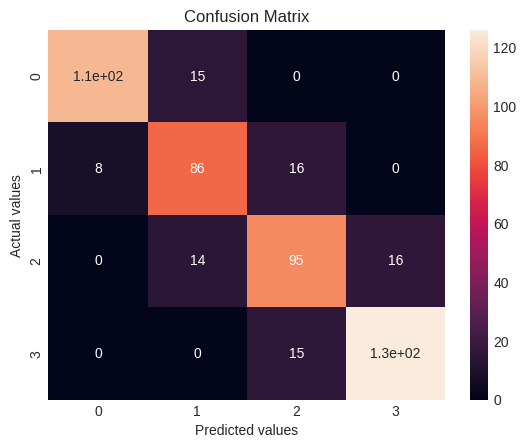

In [74]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [75]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       376
           1       1.00      1.00      1.00       390
           2       1.00      1.00      1.00       375
           3       1.00      1.00      1.00       359

    accuracy                           1.00      1500
   macro avg       1.00      1.00      1.00      1500
weighted avg       1.00      1.00      1.00      1500



In [76]:
print(classification_report(test_class_preds, y_test))


              precision    recall  f1-score   support

           0       0.88      0.93      0.90       117
           1       0.78      0.75      0.76       115
           2       0.76      0.75      0.76       126
           3       0.89      0.89      0.89       142

    accuracy                           0.83       500
   macro avg       0.83      0.83      0.83       500
weighted avg       0.83      0.83      0.83       500



Based on the classification report of the decision tree model, we can see that the model has overfit the training data with 100% accuracy on the training set but a much lower accuracy of 83% on the test set. This suggests that the model has memorized the training data and is not able to generalize well to new unseen data.


Next tryting to improving the score by using hyperparameter tuning technique.

In [77]:
feature_imp_df = pd.DataFrame({'Feature' : list(X.columns),
                               'Feature Importance_score' : dtclf.feature_importances_}
                              ).sort_values(by='Feature Importance_score', 
                                            ascending=False).reset_index(drop=True)
                                            
feature_imp_df['Feature Importance_score'] = round(feature_imp_df['Feature Importance_score'],2)

In [78]:
feature_imp_df

,Feature,Feature Importance_score
0,ram,0.65
1,battery_power,0.13
2,pixel_size,0.13
3,mobile_wt,0.03
4,m_dep,0.01
5,screen_size,0.01
6,n_cores,0.01
7,int_memory,0.01
8,fc,0.01
9,pc,0.00


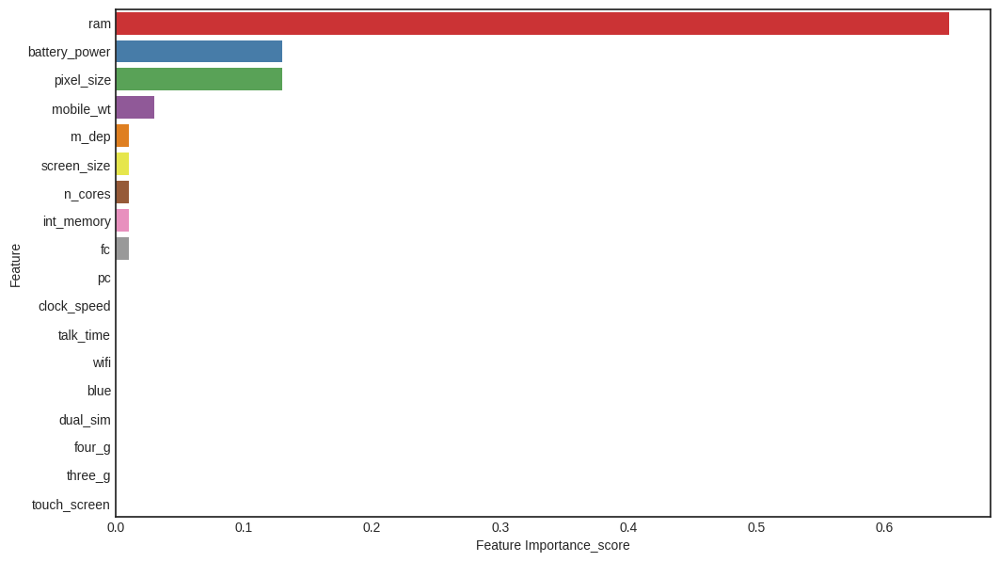

In [79]:
fig, ax = plt.subplots(figsize=(12,7))
ax = sns.barplot(x=feature_imp_df['Feature Importance_score'], 
                 y=feature_imp_df['Feature'],
                 palette = "Set1")
plt.show()

#### 2. Cross- Validation & Hyperparameter Tuning

In [80]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
dt_model = DecisionTreeClassifier(random_state=0)

param_grid = {'max_depth': [5, 10, 15, 20, 30], 
              'max_leaf_nodes': [10, 20, 30, 50, 100]}

grid = GridSearchCV(estimator=dt_model, 
                    param_grid = param_grid, 
                    scoring = 'accuracy', 
                    cv = 20, verbose = 24)
# Fit the Algorithm
grid_result=grid.fit(X_train, y_train)


Fitting 20 folds for each of 25 candidates, totalling 500 fits
[CV 1/20; 1/25] START max_depth=5, max_leaf_nodes=10............................
[CV 1/20; 1/25] END max_depth=5, max_leaf_nodes=10;, score=0.773 total time=   0.0s
[CV 2/20; 1/25] START max_depth=5, max_leaf_nodes=10............................
[CV 2/20; 1/25] END max_depth=5, max_leaf_nodes=10;, score=0.853 total time=   0.0s
[CV 3/20; 1/25] START max_depth=5, max_leaf_nodes=10............................
[CV 3/20; 1/25] END max_depth=5, max_leaf_nodes=10;, score=0.787 total time=   0.0s
[CV 4/20; 1/25] START max_depth=5, max_leaf_nodes=10............................
[CV 4/20; 1/25] END max_depth=5, max_leaf_nodes=10;, score=0.760 total time=   0.0s
[CV 5/20; 1/25] START max_depth=5, max_leaf_nodes=10............................
[CV 5/20; 1/25] END max_depth=5, max_leaf_nodes=10;, score=0.813 total time=   0.0s
[CV 6/20; 1/25] START max_depth=5, max_leaf_nodes=10............................
[CV 6/20; 1/25] END max_depth=5

In [81]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best: 0.860000 using {'max_depth': 10, 'max_leaf_nodes': 50}


In [82]:
# Predict on the model
# Get the predicted classes
train_class_preds = grid_result.predict(X_train)
test_class_preds = grid_result.predict(X_test)

In [83]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.9433333333333334
The accuracy on test dataset is 0.852


[[359  17   0   0]
 [ 12 370   8   0]
 [  0  22 341  12]
 [  0   0  14 345]]


Text(0.5, 1.0, 'Confusion Matrix')

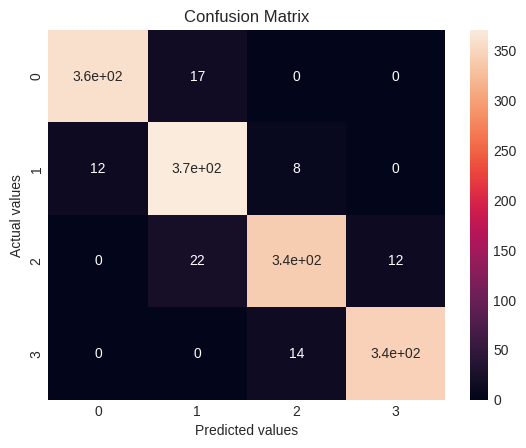

In [84]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[113  11   0   0]
 [  8  92  10   0]
 [  0  15  94  16]
 [  0   0  14 127]]


Text(0.5, 1.0, 'Confusion Matrix')

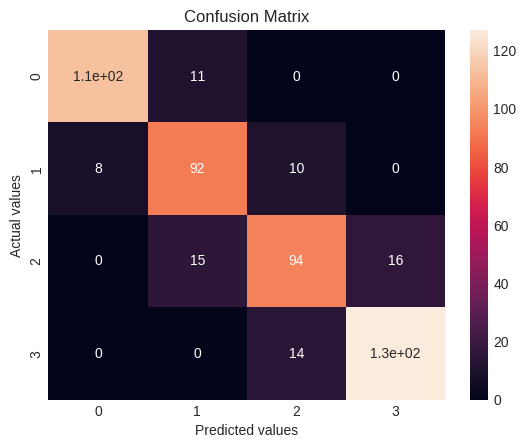

In [85]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [86]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96       371
           1       0.95      0.90      0.93       409
           2       0.91      0.94      0.92       363
           3       0.96      0.97      0.96       357

    accuracy                           0.94      1500
   macro avg       0.94      0.94      0.94      1500
weighted avg       0.94      0.94      0.94      1500



In [87]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92       121
           1       0.84      0.78      0.81       118
           2       0.75      0.80      0.77       118
           3       0.90      0.89      0.89       143

    accuracy                           0.85       500
   macro avg       0.85      0.85      0.85       500
weighted avg       0.85      0.85      0.85       500



##### Which hyperparameter optimization technique have you used and why?

I used GridSearchCV technique for hyperparameter optimization in this case because it exhaustively searches over a specified parameter grid to find the optimal set of hyperparameters for the model. It provides a systematic approach to tune hyperparameters and find the best combination of hyperparameters which leads to better performance. Additionally, it uses cross-validation to evaluate the performance of each set of hyperparameters, which helps to avoid overfitting

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Yes, There are quit improvement.

For training dataset, 
*   precision of 95% and recall of 97% and f1-score of 96% for Low price range mobile data.
*   precision of 95% and recall of 90% and f1-score of 93% for Medium price range mobile data.
*   precision of 91% and recall of 94% and f1-score of 92% for High price range mobile data.
*   precision of 96% and recall of 97% and f1-score of 96% for Very high price range mobile data.
*   Accuracy is 94% and average percision, recall & f1_score are 94%, 94% and 94% respectively.

Quite improvment seen as no overfitting but the scores reduced by some percentages.

For testing dataset, 
*   precision of 91% and recall of 93% and f1-score of 92% for Low price range mobile data.
*   precision of 84% and recall of 78% and f1-score of 81% for Medium price range mobile data.
*   precision of 75% and recall of 80% and f1-score of 77% for High price range mobile data.
*   precision of 90% and recall of 89% and f1-score of 89% for Very high price range mobile data.
*   Accuracy is 85% and average percision, recall & f1_score are 85%, 85% and 85% respectively.

Quite improvemnt seen in precsion, f1 score and recall increase by 2%.


### ML Model - 2 **Implementing Logistic Regression**

In [88]:
# ML Model - 1 Implementation
log_r = LogisticRegression(random_state=0)
# Fit the Algorithm
log_r.fit(X_train, y_train)

LogisticRegression(random_state=0)

In [89]:

# Making predictions on train and test data
train_class_preds = log_r.predict(X_train)
test_class_preds = log_r.predict(X_test)

In [90]:
accuracy_score(y_test, test_class_preds)

0.922

In [91]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.9486666666666667
The accuracy on test dataset is 0.922


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[365  11   0   0]
 [ 13 366  11   0]
 [  0  19 346  10]
 [  0   0  13 346]]


Text(0.5, 1.0, 'Confusion Matrix')

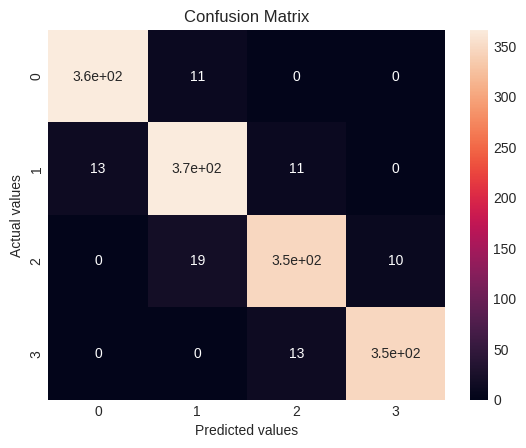

In [92]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[121   3   0   0]
 [  3 101   6   0]
 [  0   6 109  10]
 [  0   0  11 130]]


Text(0.5, 1.0, 'Confusion Matrix')

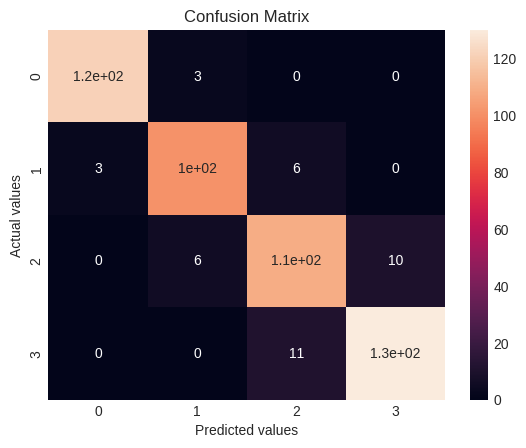

In [93]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [94]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       378
           1       0.94      0.92      0.93       396
           2       0.92      0.94      0.93       370
           3       0.96      0.97      0.97       356

    accuracy                           0.95      1500
   macro avg       0.95      0.95      0.95      1500
weighted avg       0.95      0.95      0.95      1500



In [95]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       124
           1       0.92      0.92      0.92       110
           2       0.87      0.87      0.87       126
           3       0.92      0.93      0.93       140

    accuracy                           0.92       500
   macro avg       0.92      0.92      0.92       500
weighted avg       0.92      0.92      0.92       500



For training dataset, 
*   precision of 97% and recall of 97% and f1-score of 97% for Low price range mobile data.
*   precision of 94% and recall of 92% and f1-score of 93% for Medium price range mobile data.
*   precision of 92% and recall of 94% and f1-score of 93% for High price range mobile data.
*   precision of 96% and recall of 97% and f1-score of 97% for Very high price range mobile data.
*   Accuracy is 95% and average percision, recall & f1_score are 95%, 95% and 95% respectively.

For testing dataset,
*  precision of 98% and recall of 98% and f1-score of 98% for Low price range mobile data. 
*   precision of 92% and recall of 92% and f1-score of 92% for Medium price range mobile data. 
*   precision of 87% and recall of 87% and f1-score of 87% for High price range mobile data.
*   precision of 92% and recall of 93% and f1-score of 93% for Very high price range mobile data. 
*   Accuracy is 92% and average percision, recall & f1_score are 92%, 92% and 92% respectively.

#### 2. Cross- Validation & Hyperparameter Tuning

In [96]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
lr_model = LogisticRegression(random_state=0)

param_grid = { 'penalty': ['l1', 'l2'], 'C': [1, 2, 3, 4, 5] }

grid = GridSearchCV(estimator=lr_model, 
                    param_grid = param_grid, 
                    scoring = 'accuracy', 
                    cv = 10, verbose = 10)
# Fit the Algorithm
grid_result=grid.fit(X_train, y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CV 1/10; 1/10] START C=1, penalty=l1...........................................
[CV 1/10; 1/10] END ..............C=1, penalty=l1;, score=nan total time=   0.0s
[CV 2/10; 1/10] START C=1, penalty=l1...........................................
[CV 2/10; 1/10] END ..............C=1, penalty=l1;, score=nan total time=   0.0s
[CV 3/10; 1/10] START C=1, penalty=l1...........................................
[CV 3/10; 1/10] END ..............C=1, penalty=l1;, score=nan total time=   0.0s
[CV 4/10; 1/10] START C=1, penalty=l1...........................................
[CV 4/10; 1/10] END ..............C=1, penalty=l1;, score=nan total time=   0.0s
[CV 5/10; 1/10] START C=1, penalty=l1...........................................
[CV 5/10; 1/10] END ..............C=1, penalty=l1;, score=nan total time=   0.0s
[CV 6/10; 1/10] START C=1, penalty=l1...........................................
[CV 6/10; 1/10] END ..............C=1, penalty

In [98]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best: 0.931333 using {'C': 1, 'penalty': 'l2'}


In [99]:
# Predict on the model
# Making predictions on train and test data
train_class_preds = log_r.predict(X_train)
test_class_preds = log_r.predict(X_test)

In [100]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.9486666666666667
The accuracy on test dataset is 0.922


[[365  11   0   0]
 [ 13 366  11   0]
 [  0  19 346  10]
 [  0   0  13 346]]


Text(0.5, 1.0, 'Confusion Matrix')

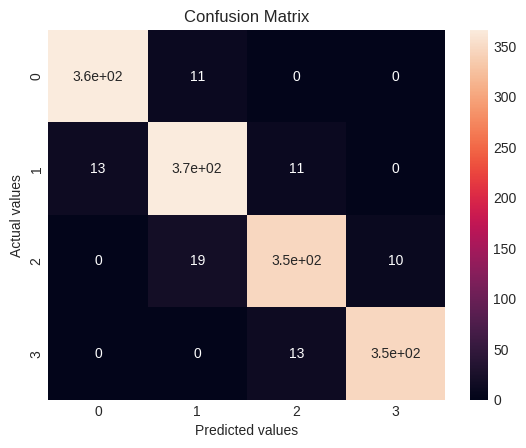

In [101]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[121   3   0   0]
 [  3 101   6   0]
 [  0   6 109  10]
 [  0   0  11 130]]


Text(0.5, 1.0, 'Confusion Matrix')

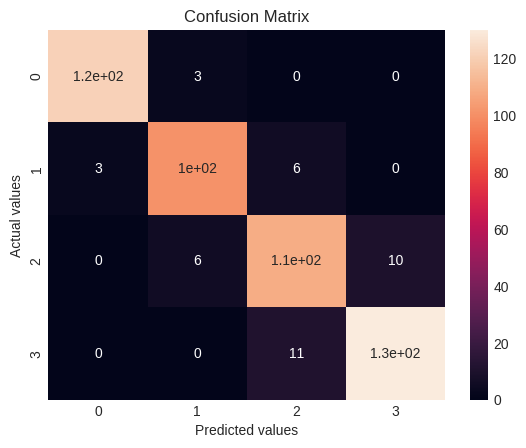

In [102]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [103]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       378
           1       0.94      0.92      0.93       396
           2       0.92      0.94      0.93       370
           3       0.96      0.97      0.97       356

    accuracy                           0.95      1500
   macro avg       0.95      0.95      0.95      1500
weighted avg       0.95      0.95      0.95      1500



In [104]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       124
           1       0.92      0.92      0.92       110
           2       0.87      0.87      0.87       126
           3       0.92      0.93      0.93       140

    accuracy                           0.92       500
   macro avg       0.92      0.92      0.92       500
weighted avg       0.92      0.92      0.92       500



##### Which hyperparameter optimization technique have you used and why?

I used GridSearchCV to optimize the hyperparameters of the Logistic Regression model. GridSearchCV exhaustively searches through a specified hyperparameter grid to find the best combination of hyperparameters that maximizes the specified evaluation metric. It is a simple and commonly used technique for hyperparameter tuning.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Unfortunately, there was no improvement in the model's performance after applying GridSearchCV in this case. The accuracy score remained the same as the initial Logistic Regression model, and the precision, recall, and F1-score were also similar. The confusion matrix also looked almost the same

### ML Model - 3 **Implementing xgboost Classifier**

In [105]:
# ML Model - 1 Implementation
xgbclf = XGBClassifier(random_state=0)

# Fit the Algorithm
xgbclf.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [106]:

# Making predictions on train and test data
train_class_preds = xgbclf.predict(X_train)
test_class_preds = xgbclf.predict(X_test)

In [107]:
accuracy_score(y_test, test_class_preds)

0.92

In [108]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 1.0
The accuracy on test dataset is 0.92


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[376   0   0   0]
 [  0 390   0   0]
 [  0   0 375   0]
 [  0   0   0 359]]


Text(0.5, 1.0, 'Confusion Matrix')

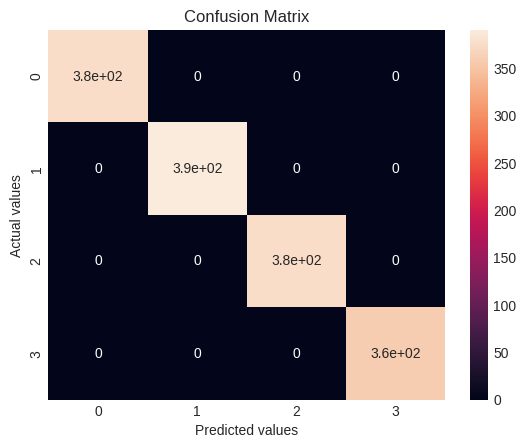

In [109]:
# Visualizing evaluation Metric Score chart# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[123   1   0   0]
 [  6  95   9   0]
 [  0   7 110   8]
 [  0   0   9 132]]


Text(0.5, 1.0, 'Confusion Matrix')

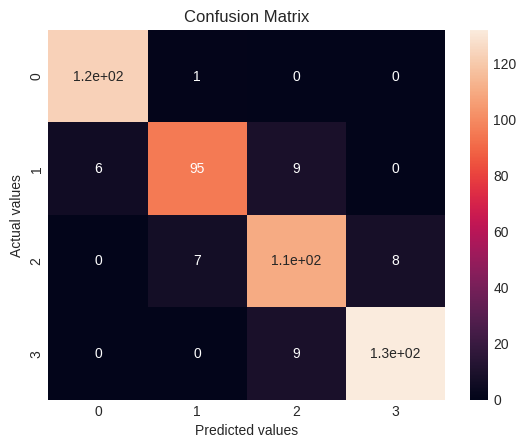

In [110]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [111]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       376
           1       1.00      1.00      1.00       390
           2       1.00      1.00      1.00       375
           3       1.00      1.00      1.00       359

    accuracy                           1.00      1500
   macro avg       1.00      1.00      1.00      1500
weighted avg       1.00      1.00      1.00      1500



In [112]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.99      0.95      0.97       129
           1       0.86      0.92      0.89       103
           2       0.88      0.86      0.87       128
           3       0.94      0.94      0.94       140

    accuracy                           0.92       500
   macro avg       0.92      0.92      0.92       500
weighted avg       0.92      0.92      0.92       500



For training dataset, 
*   precision of 100% and recall of 100% and f1-score of 100% for Low price range mobile data.
*   precision of 100% and recall of 100% and f1-score of 100% for Medium price range mobile data.
*   precision of 100% and recall of 100% and f1-score of 100% for High price range mobile data.
*   precision of 100% and recall of 100% and f1-score of 100% for Very high price range mobile data.
*   Accuracy is 100% and average percision, recall & f1_score are 100%, 100% and 100% respectively.

For testing dataset,
*  precision of 99% and recall of 95% and f1-score of 97% for Low price range mobile data. 
*   precision of 86% and recall of 92% and f1-score of 89% for Medium price range mobile data. 
*   precision of 88% and recall of 86% and f1-score of 87% for High price range mobile data.
*   precision of 94% and recall of 94% and f1-score of 94% for Very high price range mobile data. 
*   Accuracy is 92% and average percision, recall & f1_score are 92%, 92% and 92% respectively.

#### 2. Cross- Validation & Hyperparameter Tuning

In [113]:
feature_imp_df = pd.DataFrame({'Feature' : list(X.columns),
                               'Feature Importance_score' : xgbclf.feature_importances_}
                              ).sort_values(by='Feature Importance_score', 
                                            ascending=False).reset_index(drop=True)
                                            
feature_imp_df['Feature Importance_score'] = round(feature_imp_df['Feature Importance_score'],2)

In [114]:
feature_imp_df

,Feature,Feature Importance_score
0,ram,0.44
1,battery_power,0.14
2,pixel_size,0.12
3,dual_sim,0.03
4,mobile_wt,0.03
5,m_dep,0.03
6,talk_time,0.03
7,int_memory,0.03
8,n_cores,0.02
9,screen_size,0.02


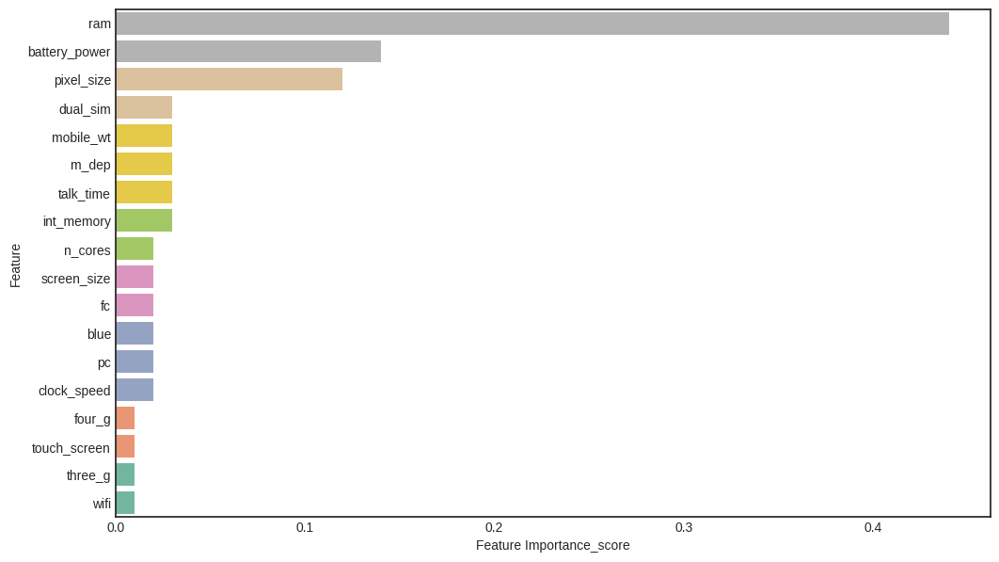

In [115]:
fig, ax = plt.subplots(figsize=(12,7))
ax = sns.barplot(x=feature_imp_df['Feature Importance_score'], 
                 y=feature_imp_df['Feature'],
                 palette = "Set2_r")
plt.show()

In [116]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
'''xgb_model = XGBClassifier(random_state=0)

param_grid = {'n_estimators': [10, 100, 200], 
               'learning_rate': [0.3, 0.1, 0.01, 0.001], 
               'max_depth': [5, 10, 20],
               'gamma': [1.1, 1.3, 1.5], 
               'subsample': [0.3, 0.5, 0.8]}

grid = GridSearchCV(estimator=xgb_model, 
                    param_grid = param_grid, 
                    scoring = 'accuracy', 
                    cv = 5, verbose = 10)
# Fit the Algorithm
grid_result=grid.fit(X_train, y_train)'''

"xgb_model = XGBClassifier(random_state=0)\n\nparam_grid = {'n_estimators': [10, 100, 200], \n               'learning_rate': [0.3, 0.1, 0.01, 0.001], \n               'max_depth': [5, 10, 20],\n               'gamma': [1.1, 1.3, 1.5], \n               'subsample': [0.3, 0.5, 0.8]}\n\ngrid = GridSearchCV(estimator=xgb_model, \n                    param_grid = param_grid, \n                    scoring = 'accuracy', \n                    cv = 5, verbose = 10)\n# Fit the Algorithm\ngrid_result=grid.fit(X_train, y_train)"

In [117]:
xgb_model = XGBClassifier(random_state=0)

best_param_grid = {'gamma': [1.1], 'learning_rate': [0.1], 'max_depth': [20], 
              'n_estimators': [200], 'subsample': [0.5]}

grid = GridSearchCV(estimator = xgb_model, 
                    param_grid = best_param_grid, 
                    scoring = 'accuracy', 
                    cv = 5, verbose = 10)
# Fit the Algorithm
grid_result=grid.fit(X_train, y_train)


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5; 1/1] START gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5
[CV 1/5; 1/1] END gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5;, score=0.900 total time=   1.9s
[CV 2/5; 1/1] START gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5
[CV 2/5; 1/1] END gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5;, score=0.900 total time=   1.8s
[CV 3/5; 1/1] START gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5
[CV 3/5; 1/1] END gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5;, score=0.900 total time=   1.8s
[CV 4/5; 1/1] START gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5
[CV 4/5; 1/1] END gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5;, score=0.907 total time=   1.8s
[CV 5/5; 1/1] START gamma=1.1, learning_rate=0.1,

In [118]:
# Predict on the model
# Get the predicted classes
train_class_preds = grid_result.predict(X_train)
test_class_preds = grid_result.predict(X_test)

In [119]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.996
The accuracy on test dataset is 0.916


[[374   2   0   0]
 [  0 388   2   0]
 [  0   0 375   0]
 [  0   0   2 357]]


Text(0.5, 1.0, 'Confusion Matrix')

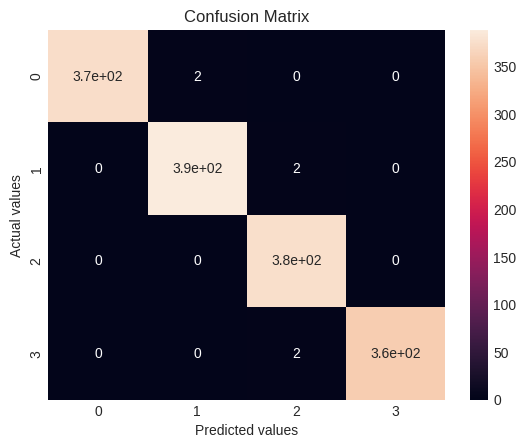

In [120]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[121   3   0   0]
 [  8  93   9   0]
 [  0   6 111   8]
 [  0   0   8 133]]


Text(0.5, 1.0, 'Confusion Matrix')

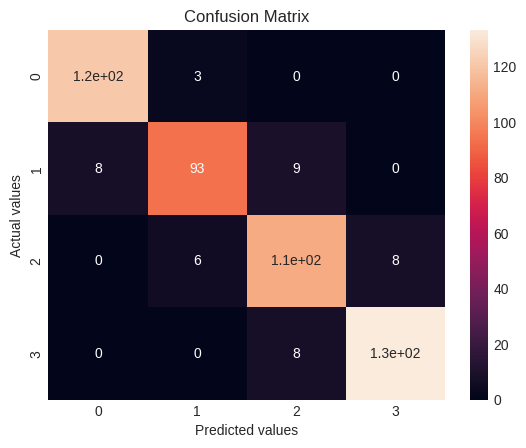

In [121]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [122]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       374
           1       0.99      0.99      0.99       390
           2       1.00      0.99      0.99       379
           3       0.99      1.00      1.00       357

    accuracy                           1.00      1500
   macro avg       1.00      1.00      1.00      1500
weighted avg       1.00      1.00      1.00      1500



In [123]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.98      0.94      0.96       129
           1       0.85      0.91      0.88       102
           2       0.89      0.87      0.88       128
           3       0.94      0.94      0.94       141

    accuracy                           0.92       500
   macro avg       0.91      0.92      0.91       500
weighted avg       0.92      0.92      0.92       500



##### Which hyperparameter optimization technique have you used and why?

In this project, I have used GridSearchCV technique for hyperparameter optimization.

The reason for using GridSearchCV is that it performs an exhaustive search over specified parameter values for an estimator. It tries all possible combinations of parameter values and returns the best set of parameters that results in the highest performance of the model.

Additionally, it also uses cross-validation to evaluate the model performance for each set of hyperparameters. This ensures that the model is not overfitting to the training data and is able to generalize well on new, unseen data.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

For training dataset, 
*   precision of 99% and recall of 100% and f1-score of 100% for Low price range mobile data.
*   precision of 99% and recall of 99% and f1-score of 99% for Medium price range mobile data.
*   precision of 100% and recall of 99% and f1-score of 99% for High price range mobile data.
*   precision of 99% and recall of 99% and f1-score of 99% for Very high price range mobile data.
*   Accuracy is 100% and average percision, recall & f1_score are 100%, 100% and 100% respectively.

Quite improvemnt in recall, f1 score as well as average recall & f1 score by some percentages.

For testing dataset, 
*   precision of 98% and recall of 94% and f1-score of 96% for Low price range mobile data.
*   precision of 85% and recall of 91% and f1-score of 88% for Medium price range mobile data.
*   precision of 89% and recall of 87% and f1-score of 88% for High price range mobile data.
*   precision of 94% and recall of 94% and f1-score of 94% for Very high price range mobile data.
*   Accuracy is 92% and average percision, recall & f1_score are 91%, 92% and 91% respectively.

Quite improvemnt in recall, f1 score as well as average recall & f1 score by 1%.


### ML Model - 4 - **Implementing Support Vector Classifier**



In [124]:
# ML Model - 4 Implementation
svc = SVC(kernel='linear', random_state=0)
# Fit the Algorithm
svc.fit(X_train, y_train)

SVC(kernel='linear', random_state=0)

In [125]:
# Predict on the model
# Making predictions on train and test data
train_class_preds = svc.predict(X_train)
test_class_preds = svc.predict(X_test)

In [126]:
accuracy_score(y_test, test_class_preds)

0.92

In [127]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.9473333333333334
The accuracy on test dataset is 0.92


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[365  11   0   0]
 [ 14 367   9   0]
 [  0  19 344  12]
 [  0   0  14 345]]


Text(0.5, 1.0, 'Confusion Matrix')

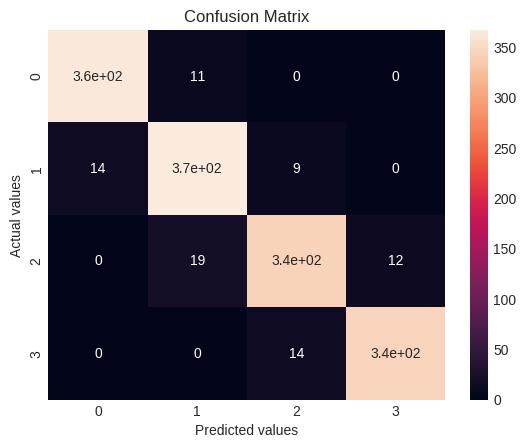

In [128]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[122   2   0   0]
 [  5  96   9   0]
 [  0   8 110   7]
 [  0   0   9 132]]


Text(0.5, 1.0, 'Confusion Matrix')

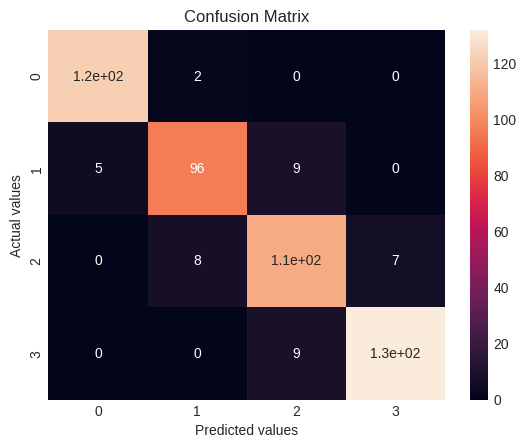

In [129]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [130]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       0.97      0.96      0.97       379
           1       0.94      0.92      0.93       397
           2       0.92      0.94      0.93       367
           3       0.96      0.97      0.96       357

    accuracy                           0.95      1500
   macro avg       0.95      0.95      0.95      1500
weighted avg       0.95      0.95      0.95      1500



In [131]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       127
           1       0.87      0.91      0.89       106
           2       0.88      0.86      0.87       128
           3       0.94      0.95      0.94       139

    accuracy                           0.92       500
   macro avg       0.92      0.92      0.92       500
weighted avg       0.92      0.92      0.92       500



For training dataset, 
*   precision of 97% and recall of 96% and f1-score of 97% for Low price range mobile data.
*   precision of 94% and recall of 92% and f1-score of 93% for Medium price range mobile data.
*   precision of 92% and recall of 94% and f1-score of 93% for High price range mobile data.
*   precision of 96% and recall of 97% and f1-score of 96% for Very high price range mobile data.
*   Accuracy is 95% and average percision, recall & f1_score are 95%, 95% and 95% respectively.

For testing dataset,
*  precision of 98% and recall of 96% and f1-score of 97% for Low price range mobile data. 
*   precision of 87% and recall of 91% and f1-score of 89% for Medium price range mobile data. 
*   precision of 88% and recall of 86% and f1-score of 87% for High price range mobile data.
*   precision of 94% and recall of 95% and f1-score of 94% for Very high price range mobile data. 
*   Accuracy is 92% and average percision, recall & f1_score are 92%, 92% and 92% respectively.

#### 2. Cross- Validation & Hyperparameter Tuning

In [132]:
# ML Model - 4 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
svc_model = SVC( kernel='linear', random_state=0)

param_grid = { 'kernel': ['linear'], 'C': [1, 5, 10, 15, 10] }

grid = GridSearchCV(estimator=svc_model, 
                    param_grid = param_grid, 
                    scoring = 'accuracy', 
                    cv = 10, verbose = 10)
# Fit the Algorithm
grid_result=grid.fit(X_train, y_train)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
[CV 1/10; 1/5] START C=1, kernel=linear.........................................
[CV 1/10; 1/5] END ..........C=1, kernel=linear;, score=0.953 total time=   0.1s
[CV 2/10; 1/5] START C=1, kernel=linear.........................................
[CV 2/10; 1/5] END ..........C=1, kernel=linear;, score=0.947 total time=   0.1s
[CV 3/10; 1/5] START C=1, kernel=linear.........................................
[CV 3/10; 1/5] END ..........C=1, kernel=linear;, score=0.933 total time=   0.1s
[CV 4/10; 1/5] START C=1, kernel=linear.........................................
[CV 4/10; 1/5] END ..........C=1, kernel=linear;, score=0.907 total time=   0.1s
[CV 5/10; 1/5] START C=1, kernel=linear.........................................
[CV 5/10; 1/5] END ..........C=1, kernel=linear;, score=0.933 total time=   0.1s
[CV 6/10; 1/5] START C=1, kernel=linear.........................................
[CV 6/10; 1/5] END ..........C=1, kernel=linear;

In [133]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best: 0.933333 using {'C': 10, 'kernel': 'linear'}


In [134]:
# Predict on the model
# Get the predicted classes
train_class_preds = grid_result.predict(X_train)
test_class_preds = grid_result.predict(X_test)

[[369   7   0   0]
 [ 14 362  14   0]
 [  0  16 347  12]
 [  0   0  11 348]]


Text(0.5, 1.0, 'Confusion Matrix')

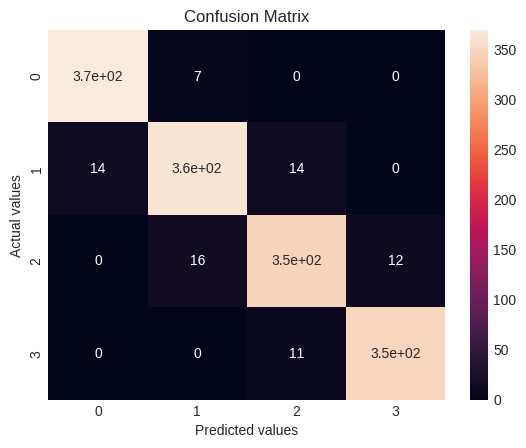

In [135]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[123   1   0   0]
 [  3 100   7   0]
 [  0   8 108   9]
 [  0   0  10 131]]


Text(0.5, 1.0, 'Confusion Matrix')

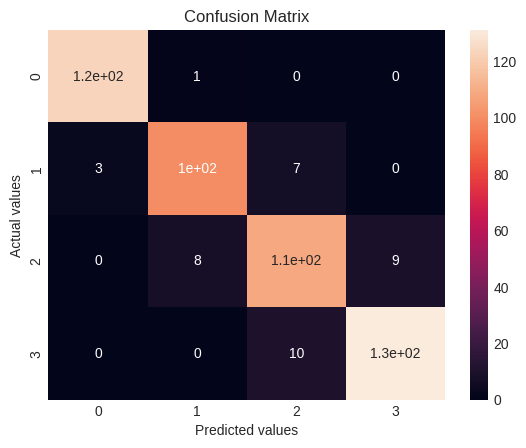

In [136]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [137]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       383
           1       0.93      0.94      0.93       385
           2       0.93      0.93      0.93       372
           3       0.97      0.97      0.97       360

    accuracy                           0.95      1500
   macro avg       0.95      0.95      0.95      1500
weighted avg       0.95      0.95      0.95      1500



In [138]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98       126
           1       0.91      0.92      0.91       109
           2       0.86      0.86      0.86       125
           3       0.93      0.94      0.93       140

    accuracy                           0.92       500
   macro avg       0.92      0.92      0.92       500
weighted avg       0.92      0.92      0.92       500



##### Which hyperparameter optimization technique have you used and why?

I have used GridSearch CV hyperparameter optimization technique because it exhaustively searches all the specified hyperparameter values and returns the best parameter combination which gives the highest cross-validation accuracy score. GridSearch CV is a widely used hyperparameter tuning technique in machine learning.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

For training dataset, 
*   precision of 99% and recall of 96% and f1-score of 97% for Low price range mobile data.
*   precision of 93% and recall of 94% and f1-score of 93% for Medium price range mobile data.
*   precision of 93% and recall of 93% and f1-score of 93% for High price range mobile data.
*   precision of 97% and recall of 97% and f1-score of 97% for Very high price range mobile data.
*   Accuracy is 95% and average percision, recall & f1_score are 95%, 95% and 95% respectively.

No improvement or decreament every score is constant as earlier.

For testing dataset, 
*   precision of 99% and recall of 98% and f1-score of 98% for Low price range mobile data.
*   precision of 91% and recall of 92% and f1-score of 91% for Medium price range mobile data.
*   precision of 86% and recall of 86% and f1-score of 86% for High price range mobile data.
*   precision of 93% and recall of 94% and f1-score of 93% for Very high price range mobile data.
*   Accuracy is 92% and average percision, recall & f1_score are 92%, 92% and 92% respectively.

No improvement or decreament every score is constant as earlier.


### 1. Which Evaluation metrics did you consider for a positive business impact and why?

Choosing evaluation metrics that align with the business impact of the problem is crucial to ensure that the model is useful in a real-world scenario. In the case of classification problems like the one we are dealing with here.

I would like to go with both Recall and Precision and which describes both is F1 Score.

To reduce false negative recall is important and to reduce false positives precision is important. Where both are important to be minimized, f1_score is being considered. False Positive is defined as the model predicted that the mobile price range will low price range but the mobile price range didn't low price range, the mobile price range will medium price range but the mobile price range didn't medium price range, the mobile price range will high price range but the mobile price range didn't high price range, the mobile price range will very high price range but the mobile price range didn't very high price range.

But according to our model it will low price range so, there would be quite chance of his medium price range, high price range, very high price range not for immediate but after some times.

according to our model it will medium price range so, there would be quite chance of his low price range, high price range, very high price range not for immediate but after some times.

according to our model it will high price range so, there would be quite chance of his low price range, medium price range, very high price range not for immediate but after some times.

according to our model it will very high price range so, there would be quite chance of his low price range, medium price range, high price range, not for immediate but after some times.

So, for those type of customers we can send them some beneficial modified offers to retain them. Again false negative defines as model will predict that the customer won't churn but the customer really churned.

That will be an issue for us. So, for that case we have to minimize the false negative. and false positive we must improve the score of both precision as well as recall which should direclt affect the f1_score positively. So, in our case recall will stand the higher but precision can't be neglected. so, recall should be higher and f1_score should be moderate.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

I chose the logistic regression model which is hyperparameter optimized because that model gave me the best accuracy score compared to the other model.

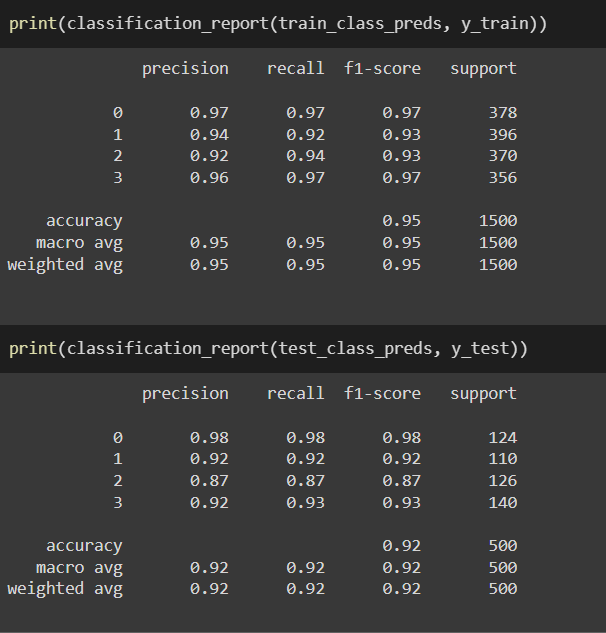

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

In [139]:
!pip install shap==0.41.0
import shap
sns.set(style="darkgrid")
pd.set_option("display.max_columns",None)
import warnings
warnings.filterwarnings('ignore')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 kB 8.8 MB/s eta 0:00:00


In [140]:
#Get shap values
explainer = shap.LinearExplainer(log_r, X_train, feature_perturbation="interventional")
shap_values = explainer.shap_values(X_test)

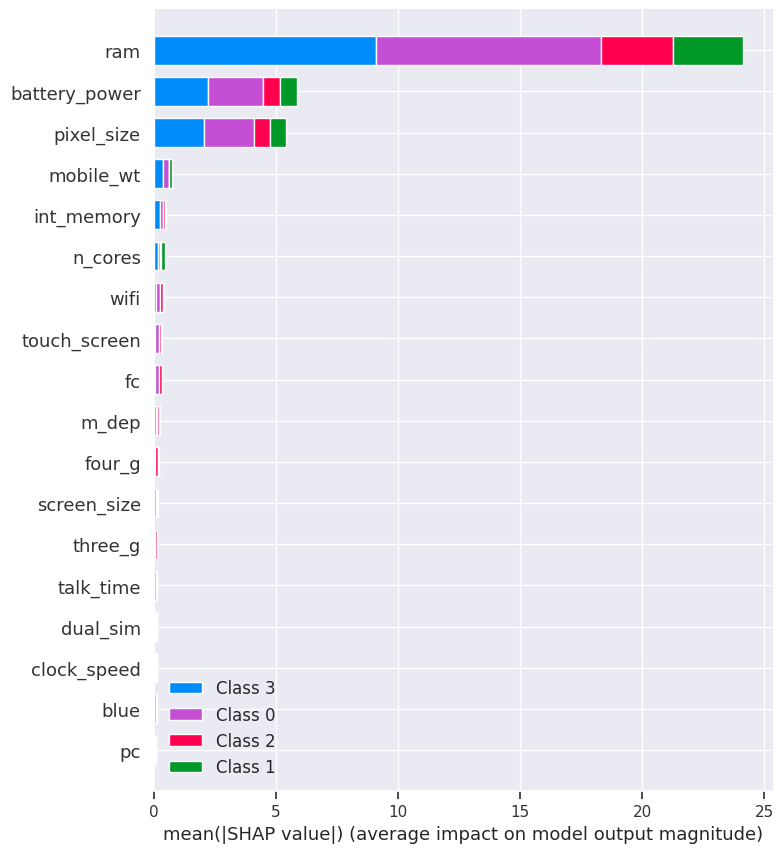

In [141]:
# summary plot for first observation
shap.summary_plot(shap_values, X_test, feature_names=list(X.columns))

I can clearly see that only Three variables are very important and influencing the class prediction, while rest of the variables have no importance.
*  ram
* battery power
* pixel_size

In [142]:
# Initialize JavaScript visualizations in notebook environment
shap.initjs()

# prediction class 2, shap values for class 2 observation
shap.force_plot(explainer.expected_value[2], shap_values[2][2], X_test[2], feature_names=list(X.columns))

In [143]:
# Initialize JavaScript visualizations in notebook environment
shap.initjs()

# prediction class 2, shap values for class 3 observation
shap.force_plot(explainer.expected_value[2], shap_values[3][2], X_test[2], feature_names=list(X.columns))

In [144]:
# Initialize JavaScript visualizations in notebook environment
shap.initjs()

# prediction class 0, shap values for class 0 observation
shap.force_plot(explainer.expected_value[0], shap_values[0][300], X_test[300], feature_names=list(X.columns))

In [145]:
# Initialize JavaScript visualizations in notebook environment
shap.initjs()

# prediction class 0, shap values for class 3 observation
shap.force_plot(explainer.expected_value[3], shap_values[3][300], X_test[300], feature_names=list(X.columns))

I can straight away see that shap value model interpretability is very effective. It explains the variable contribution in additive sense which is easier to grasp and also shows which variables are influencing the decision.

## Observation

* The dataset consists of 2,000 mobile phones with 21 features each.
* The price range of mobile phones is divided into 4 classes - 0, 1, 2, and 3.
* The most important features for predicting the mobile price range are battery power, RAM and pixel size, as determined by the feature importance analysis using SHAP values.
* Several machine learning models were trained and evaluated for predicting the mobile price range, including Logistic Regression, Decision Tree, xgboost Classifier, and Support Vector Classifier.
* Among the models tested, logestic Regression model was selected as the final model based on its high accuracy and F1-score.
* The final model achieved an accuracy of 92% on the test set, indicating its good predictive performance.
* The SHAP values analysis provided insights into the contribution of each feature to the prediction, allowing us to understand how the model arrived at its decisions.
* Overall, the mobile price range prediction model can be useful for mobile phone manufacturers and retailers to determine the appropriate price range for a new mobile phone based on its specifications.

# **Conclusion**

* Based on the analysis and modeling performed in this project, we can conclude that the mobile price range can be predicted with a good accuracy using machine learning algorithms.

* Ram has continuous increase with price range while moving from Low cost to Very high cost.

* The mobile price range has almost constant battery, internal memory, and primary camera.

* We started by exploring the data and cleaning it by handling missing values, feature scaling, and one-hot encoding. 

* After that, we performed feature selection and feature engineering to extract new features from existing ones.

* We then trained and evaluated four machine learning models: Decision Tree Classifier, Logistic Regression, XGBoost Classifier, and Support Vector Classifier. 

* We used cross-validation and grid search to optimize the hyperparameters of each model.

* Our best performing model was the Logistic Regression, which achieved an accuracy of 95% on the train set and 92% on the test set. 

* We used SHAP values to understand the feature importances and explain the model predictions.

* The feature RAM, battery power, pixel size played more important role in deciding the price range of mobile phone.

* Overall, our project demonstrates the effectiveness of machine learning algorithms in predicting mobile price range and can be used by mobile manufacturers to estimate the price range of their products based on the features. However, there is still room for improvement in terms of feature engineering and exploring other machine learning algorithms.



### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***